/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


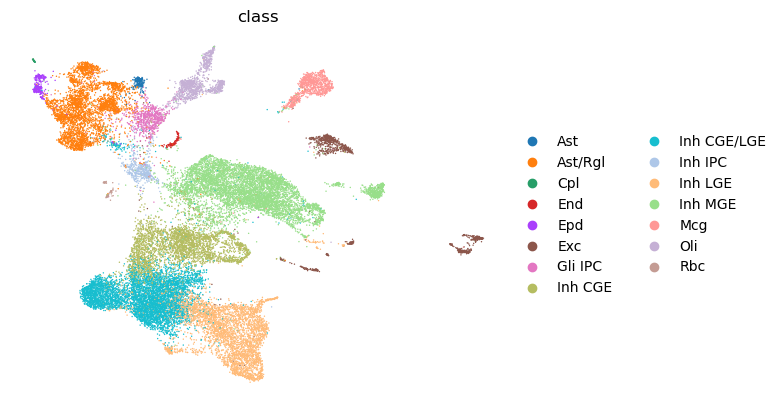

In [1]:
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import os
import pandas as pd

os.chdir("/wynton/group/paredes/Aunoy/python")

# load sparse matrix:
X = io.mmread("harc_counts.mtx")

# create anndata object
adata = anndata.AnnData(
    X=X.transpose().tocsr()
)

# load cell metadata:
cell_meta = pd.read_csv("harc_metadata.csv")

# load gene names:
with open("harc_gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

# set anndata observations and index obs by barcodes, var by gene names
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

# load dimensional reduction:
pca = pd.read_csv("harc_pca.csv")
scvi = pd.read_csv("harc_scvi.csv")
pca.index = adata.obs.index
scvi.index = adata.obs.index

# set pca and umap
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_scvi'] = scvi.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T

# plot a UMAP colored by sampleID to test:
sc.pl.umap(adata, color=['class'], frameon=False, save=True)

In [3]:
# save dataset as anndata format
#adata.write('/wynton/group/paredes/Aunoy/monocle_data.h5ad')

# reload dataset
adata = sc.read_h5ad('/wynton/group/paredes/Aunoy/monocle_data.h5ad')

In [2]:
import numpy as np

import cellrank as cr
import scanpy as sc
import scvelo as scv
#import palantir
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import os
import pandas as pd


scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
sc.settings.set_figure_params(frameon=False, dpi=100)
cr.settings.verbosity = 2

In [2]:
import warnings

warnings.simplefilter("ignore", category=UserWarning)

In [4]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30, use_rep = "X_scvi")

In [5]:
sc.tl.diffmap(adata)

/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wyn

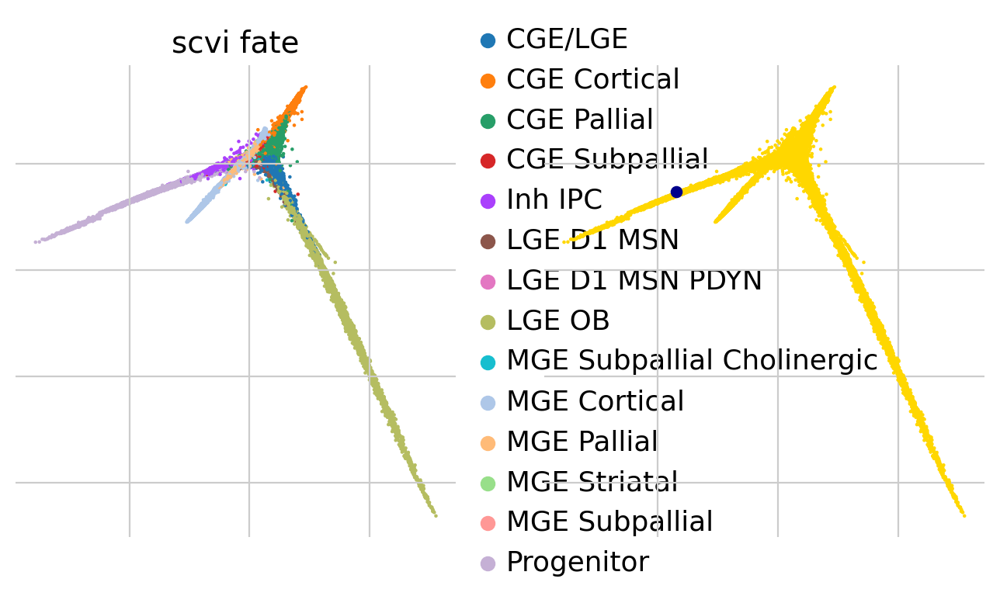

In [40]:
root_ixs = adata.obsm['X_diffmap'][:,0].argmax()  # has been found using `adata.obsm['X_diffmap'][:, 3].argmax()`

scv.pl.scatter(
    adata,
    basis="diffmap",
    c=["scvi_fate", root_ixs],
    legend_loc="right",
    components=["2, 3"],
)

In [41]:
adata

AnnData object with n_obs × n_vars = 104681 × 42862
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'unintegrated_clusters', 'seurat_clusters', 'celltypes', 'scvi_clusters', 'class', 'dataset', 'RNA_snn_res.0.5', 'ident', 'percent.mt', 'doublets', 'sample', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'cellnames', 'celltypes_final', 'celltypes_sub_final', 'stages_final', 'age', 'scvi_class', 'monocle_pseudotime', 'barcode', 'UMAP_1', 'UMAP_2', 'scvi_fate'
    uns: 'scvi_class_colors', 'neighbors', 'diffmap_evals', 'scvi_fate_colors'
    obsm: 'X_pca', 'X_scvi', 'X_umap', 'X_diffmap'
    obsp: 'distances', 'connectivities'

    adata.uns['iroot'] = root_cell_index
    adata.var['xroot'] = adata[root_cell_name, :].X


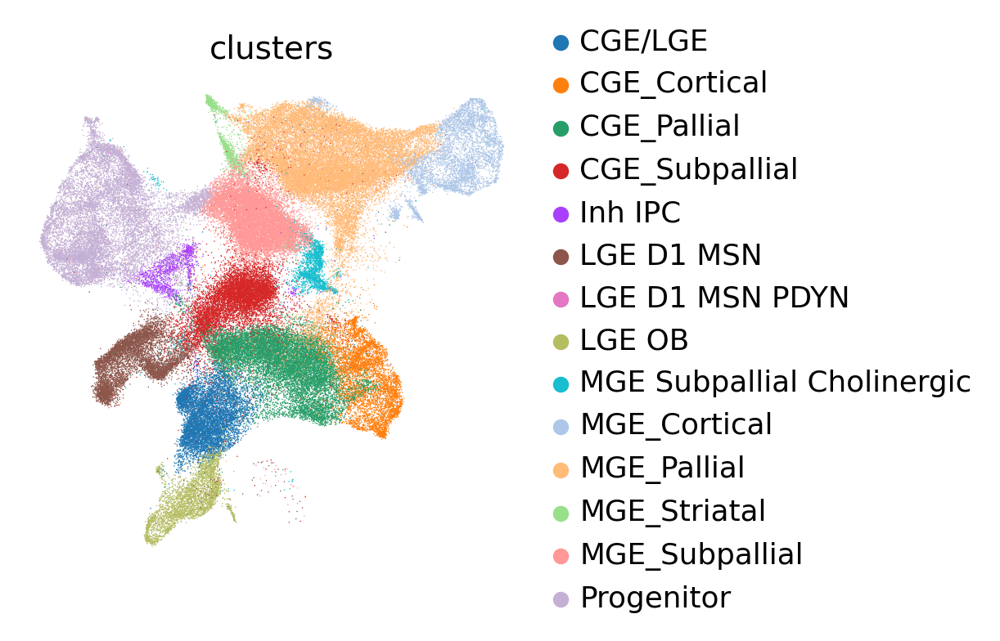

In [6]:
#adata.uns["iroot"] = root_ixs
adata.obs['clusters'] = adata.obs['scvi_fate']
sc.tl.dpt(adata)
sc.pl.embedding(
    adata,
    basis="umap",
    #color=["monocle_pseudotime", "clusters"],
    color=["clusters"],
    color_map="gnuplot2",
)

In [30]:
dm_res = palantir.utils.run_diffusion_maps(adata, pca_key = "X_scvi", n_components=5)

In [31]:
ms_data = palantir.utils.determine_multiscale_space(adata)

In [32]:
imputed_X = palantir.utils.run_magic_imputation(adata)


KeyboardInterrupt: 

In [23]:
import palantir

/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/mellon/__init__.py:1: DeprecationWarning: Accessing jax.config via the jax.config submodule is deprecated.
  from jax.config import config as jaxconfig
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/mellon/util.py:9: DeprecationWarning: Accessing jax.config via the jax.config submodule is deprecated.
  from jax.config import config as jaxconfig


In [27]:
## We want to do
## CGE endpoint
## MGE endpoint
## MGE Striatal endpoint
## LGE OB Endpoint
## LGE D1 MSN PDYN
## LGE D1 MSN
## MGE Subpallial

cge_df = adata.obs[adata.obs['clusters'] == "CGE"][['barcode', 'UMAP_1', 'UMAP_2']]
cge_pos = cge_df.iloc[np.argmax(cge_df['UMAP_1']), :]["barcode"]
cge_pos = adata.obs.iloc[89134, :]["barcode"]

#mge_df = adata.obs[adata.obs['clusters'] == "MGE"][['barcode', 'UMAP_1', 'UMAP_2']]
#mge_pos = mge_df.iloc[np.argmax(mge_df['UMAP_1']), :]["barcode"]

lgeob_df = adata.obs[adata.obs['clusters'] == "LGE OB"][['barcode', 'UMAP_1', 'UMAP_2']]
lgeob_pos = lgeob_df.iloc[np.argmin(lgeob_df['UMAP_2']), :]["barcode"]

#lged1msn_df = adata.obs[adata.obs['clusters'] == "LGE D1 MSN" & adata.obs['UMAP_2'] < 1][['barcode', 'UMAP_1', 'UMAP_2']]
#lged1msn_pos = lged1msn_df.iloc[np.argmin(lged1msn_df['UMAP_1']), :]["barcode"]

#lged1msn2_df = adata.obs[adata.obs['clusters'] == "LGE D1 MSN PDYN"][['barcode', 'UMAP_1', 'UMAP_2']]
#lged1msn2_pos = lged1msn2_df.iloc[np.argmax(lged1msn2_df['UMAP_1']), :]["barcode"]

#mge_sp_df = adata.obs[adata.obs['clusters'] == "MGE Subpallial Cholinergic"][['barcode', 'UMAP_1', 'UMAP_2']]
#mge_sp_pos = mge_sp_df.iloc[np.argmax(mge_sp_df['UMAP_1']), :]["barcode"]

#mge_str_df = adata.obs[adata.obs['clusters'] == "MGE Striatal"][['barcode', 'UMAP_1', 'UMAP_2']]
#mge_str_pos = mge_str_df.iloc[np.argmin(mge_str_df['UMAP_1']), :]["barcode"]                                             

In [36]:
lged1msn_df = adata.obs[np.logical_and(adata.obs['UMAP_2'] < 0, 
                                       adata.obs['clusters'] == "LGE D1 MSN")][['barcode', 'UMAP_1', 'UMAP_2']]
lged1msn_pos = lged1msn_df.iloc[np.argmin(lged1msn_df['UMAP_1']), :]["barcode"]

lged1msn2_df = adata.obs[np.logical_and(adata.obs['UMAP_2'] < -3, 
                                       adata.obs['clusters'] == "LGE D1 MSN PDYN")][['barcode', 'UMAP_1', 'UMAP_2']]
lged1msn2_pos = lged1msn2_df.iloc[np.argmax(lged1msn2_df['UMAP_1']), :]["barcode"]

mge_sp_df = adata.obs[np.logical_and(adata.obs['UMAP_2'] < 1.5, 
                                       adata.obs['clusters'] == "MGE Subpallial Cholinergic")][['barcode', 'UMAP_1', 'UMAP_2']]
mge_sp_pos = mge_sp_df.iloc[np.argmax(mge_sp_df['UMAP_1']), :]["barcode"]

#mge_df = adata.obs[adata.obs['clusters'] == "MGE"][['barcode', 'UMAP_1', 'UMAP_2']]
mge_pos = adata.obs.iloc[np.argmax(adata.obs['UMAP_1']), :]["barcode"]
#mge_pos = mge_sp_pos

cge_pos = adata.obs.iloc[89134, :]["barcode"]
mge_str_pos = adata.obs.iloc[16409, :]["barcode"]
#mge_pos = 'TTTAGTCTCTTGTTAC-1_7_4'
#
#cge_pos = adata.obs.iloc[root_ixs, :]["barcode"]
#cge_pos

In [37]:
terminal_states = pd.Series(
    ["CGE", "MGE", "LGE OB", "LGE D1 MSN", "LGE D1 MSN PDYN",
    "MGE Subpallial Cholinergic", "MGE Striatal"],
    index=[cge_pos, mge_pos, lgeob_pos, lged1msn_pos,
          lged1msn2_pos, mge_sp_pos, mge_str_pos],
)

In [38]:
#terminal_states = pd.Series(
#    ["CGE", "MGE", "LGE OB"],
#    index=[cge_pos, mge_pos, lgeob_pos],
#)

(<Figure size 400x400 with 1 Axes>, <Axes: >)

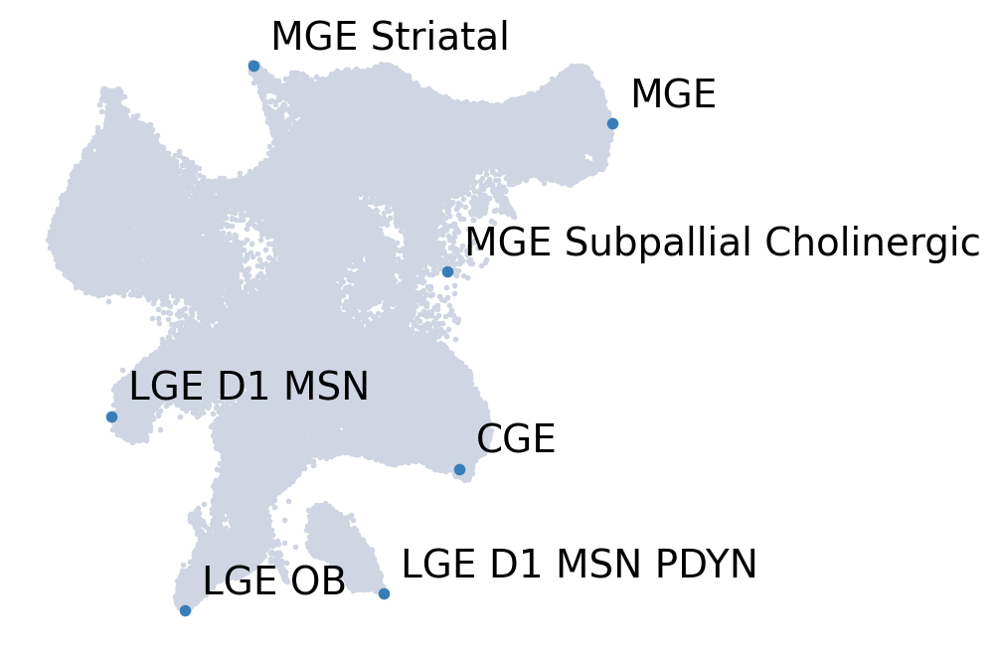

In [39]:
palantir.plot.highlight_cells_on_umap(adata, terminal_states)

In [40]:
adata

AnnData object with n_obs × n_vars = 108118 × 42862
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'unintegrated_clusters', 'seurat_clusters', 'celltypes', 'scvi_clusters', 'class', 'dataset', 'RNA_snn_res.0.5', 'ident', 'percent.mt', 'doublets', 'sample', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'cellnames', 'celltypes_final', 'celltypes_sub_final', 'stages_final', 'age', 'scvi_class', 'barcode', 'UMAP_1', 'UMAP_2', 'clusters', 'dpt_pseudotime', 'palantir_pseudotime', 'palantir_entropy', 'macrostates_fwd'
    uns: 'DM_EigenValues', 'diffmap_evals', 'iroot', 'neighbors', 'palantir_waypoints', 'scvi_class_colors', 'T_fwd_params', 'clusters_colors', 'schur_matrix_fwd', 'eigendecomposition_fwd', 'macrostates_fwd_colors', 'coarse_fwd'
    obsm: 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'X_diffmap', 'X_pca', 'X_scvi', 'X_umap', 'palantir_fate_probabilities', 'T_fwd_umap', 'schur_vectors_fwd', 'macrostates_fwd_memberships', 'X_fate_simplex_fwd'
    obsp: '

In [41]:
terminal_states

AGCGATTGTGTGTTTG-1_14_3                                      CGE
GTTTACTAGCCGATCC-1_7_4                                       MGE
2018-003_aArc_AGGTCATGTGGCGTAA-1_1                        LGE OB
GAGGTGAAGCCTATGT.GW16_2                               LGE D1 MSN
TGTGTTTTCAGCTCGG.GW12_02_2                       LGE D1 MSN PDYN
TGCCAAAGTTAAAGAC.GW09_2               MGE Subpallial Cholinergic
2018-003_pArc_CAAGGGATCTACCAGA-1_1                  MGE Striatal
dtype: object

In [42]:
start_pos = 67320
start_cell = adata.obs.iloc[start_pos, :]["barcode"]

In [ ]:
pr_res = palantir.core.run_palantir(
    adata, start_cell, num_waypoints=1500, terminal_states=terminal_states
)

/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/pandas/core/algorithms.py:1814: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/sklearn/utils/validation.py:595: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/sklearn/utils/validation.py:604: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


Sampling and flocking waypoints...
Time for determining waypoints: 0.9244857430458069 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/pandas/core/algorithms.py:1814: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/sklearn/utils/validation.py:595: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/sklearn/utils/validation.py:604: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/pandas/core/algo

In [ ]:
palantir.plot.plot_palantir_results(adata, s=3)
#plt.show()

In [117]:
lgeob_df = adata.obs[adata.obs['clusters'] == "LGE OB"][['barcode', 'UMAP_1', 'UMAP_2']]
lgeob_pos = lgeob_df.iloc[np.argmin(lgeob_df['UMAP_2']), :]["barcode"]

In [118]:
lgeob_pos

'2018-003_aArc_AGGTCATGTGGCGTAA-1_1'

In [16]:
adata.write('/wynton/group/paredes/Aunoy/integ_data.h5ad')

In [164]:
adata.obs['UMAP_2'] < 1

barcode
2018-023_Arc_CAGATACCAACCGTGC-1_1    False
2018-023_Arc_GGGCTACTCGCCTCTA-1_1     True
2018-023_Arc_TCTAACTCACTTCAGA-1_1    False
2018-023_Arc_CCTCATGTCGACATCA-1_1    False
2018-023_Arc_TCTTTGAAGATACGAT-1_1     True
                                     ...  
TTTGGAGCACGATAGG-1_15_4               True
TTTGGAGTCGACTCCT-1_15_4              False
TTTGGTTAGATGGGCT-1_15_4               True
TTTGGTTTCCACAAGT-1_15_4               True
TTTGTTGGTAACCAGG-1_15_4               True
Name: UMAP_2, Length: 108118, dtype: bool

In [197]:
adata

AnnData object with n_obs × n_vars = 108118 × 42862
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'unintegrated_clusters', 'seurat_clusters', 'celltypes', 'scvi_clusters', 'class', 'dataset', 'RNA_snn_res.0.5', 'ident', 'percent.mt', 'doublets', 'sample', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'cellnames', 'celltypes_final', 'celltypes_sub_final', 'stages_final', 'age', 'scvi_class', 'barcode', 'UMAP_1', 'UMAP_2', 'clusters', 'dpt_pseudotime', 'palantir_pseudotime', 'palantir_entropy'
    uns: 'DM_EigenValues', 'diffmap_evals', 'iroot', 'neighbors', 'palantir_waypoints', 'scvi_class_colors'
    obsm: 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'X_diffmap', 'X_pca', 'X_scvi', 'X_umap', 'palantir_fate_probabilities'
    obsp: 'DM_Kernel', 'DM_Similarity', 'connectivities', 'distances'

    adata.uns['iroot'] = root_cell_index
    adata.var['xroot'] = adata[root_cell_name, :].X


KeyError: 'Could not find key palantir_pseudotime in .var_names or .obs.columns.'

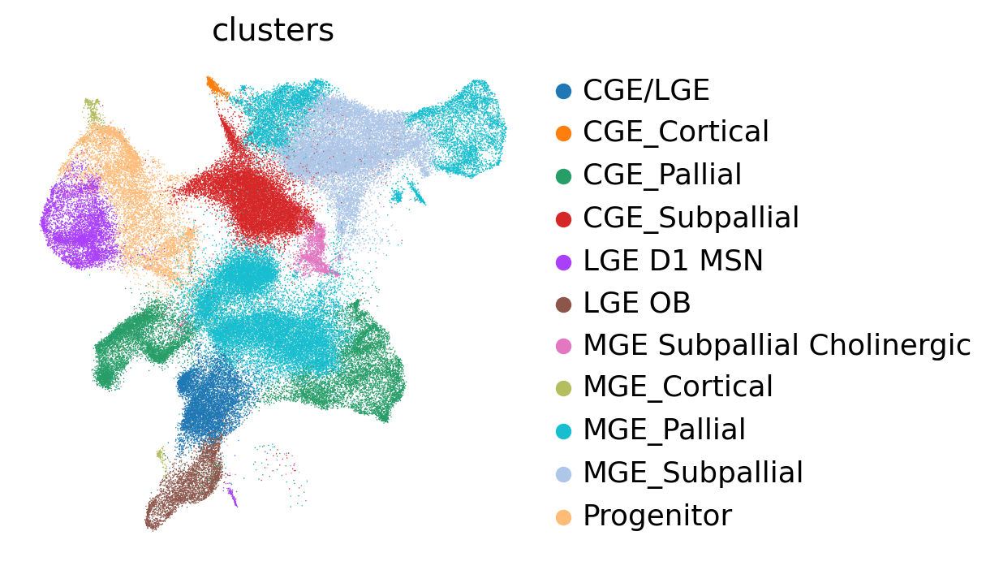

In [35]:
#adata.uns["iroot"] = root_ixs
#adata.obs['clusters'] = adata.obs['scvi_class']
sc.tl.dpt(adata)
sc.pl.embedding(
    adata,
    basis="umap",
    color=["clusters", "palantir_pseudotime"],
    color_map="gnuplot2",
)

In [7]:
pk = cr.kernels.PseudotimeKernel(adata, time_key="monocle_pseudotime")
pk.compute_transition_matrix()

print(pk)

Computing transition matrix based on pseudotime


100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 104681/104681 [00:30<00:00, 3406.56cell/s]


    Finish (0:00:37)
PseudotimeKernel[n=104681]


Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:51)


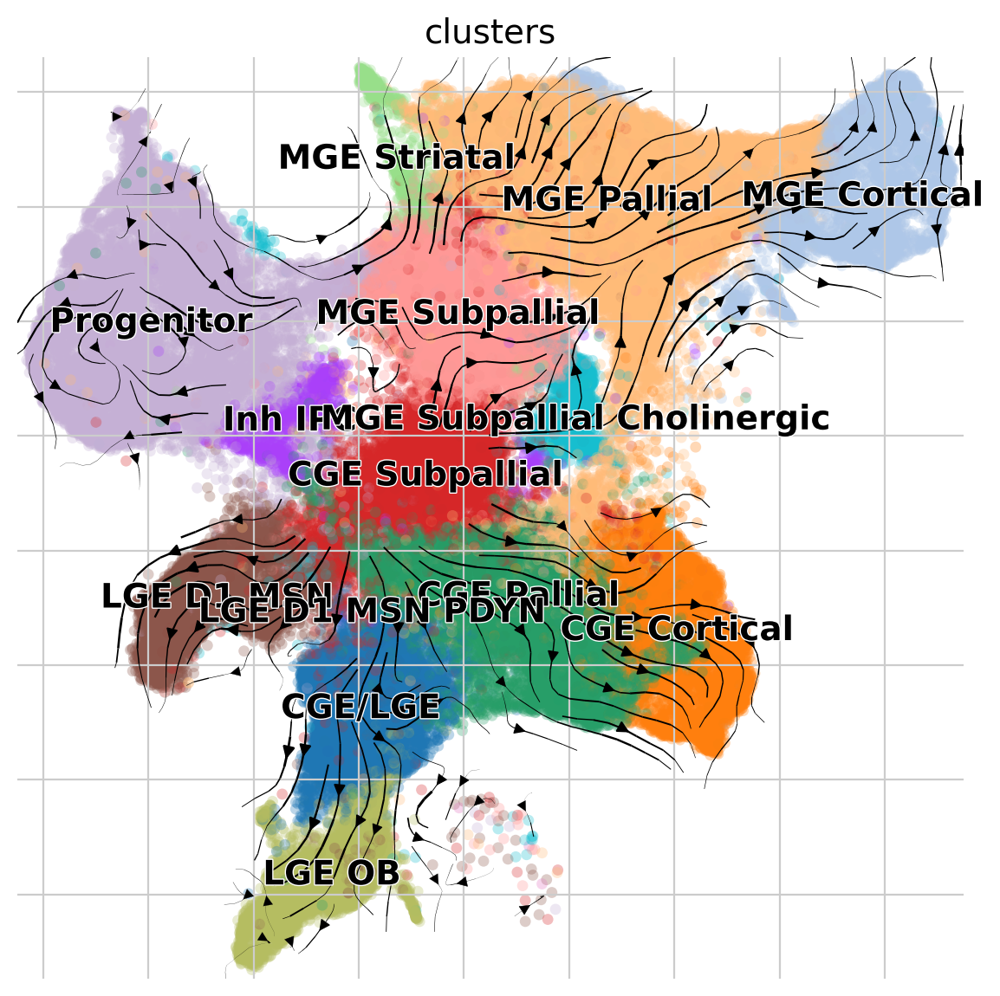

In [10]:
pk.plot_projection(basis="umap", recompute=True, figsize=(7, 7))


In [17]:
pk.plot_single_flow(cluster="CGE Subpallial", cluster_key = "scvi_fate", time_key = "age", figsize=(7, 7))

TypeError: Unable to convert `adata.obs['age']` of type `categorical` to `float`.

In [14]:
adata.obs["age"]

barcode
2018-023_Arc_CAGATACCAACCGTGC-1_1    GW24-40
2018-023_Arc_GGGCTACTCGCCTCTA-1_1    GW24-40
2018-023_Arc_TCTAACTCACTTCAGA-1_1    GW24-40
2018-023_Arc_CCTCATGTCGACATCA-1_1    GW24-40
2018-023_Arc_TCTTTGAAGATACGAT-1_1    GW24-40
                                      ...   
TTTGGAGCACGATAGG-1_15_4              GW24-40
TTTGGAGTCGACTCCT-1_15_4              GW24-40
TTTGGTTAGATGGGCT-1_15_4              GW24-40
TTTGGTTTCCACAAGT-1_15_4              GW24-40
TTTGTTGGTAACCAGG-1_15_4              GW24-40
Name: age, Length: 104681, dtype: category
Categories (5, object): ['GW09-12', 'GW13-17', 'GW18-24', 'GW24-40', 'Term']

In [46]:
g = cr.estimators.GPCCA(pk, initial_states = "Progenitor")
print(g)

GPCCA[kernel=PseudotimeKernel[n=104681], initial_states=None, terminal_states=None]


In [52]:
g.fit(cluster_key="clusters", n_states=[10, 18])
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[18]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:14)
Calculating minChi criterion in interval `[10, 18]`


ValueError: Clustering into 18 clusters will split complex conjugate eigenvalues. Request one cluster more or less.

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wyn

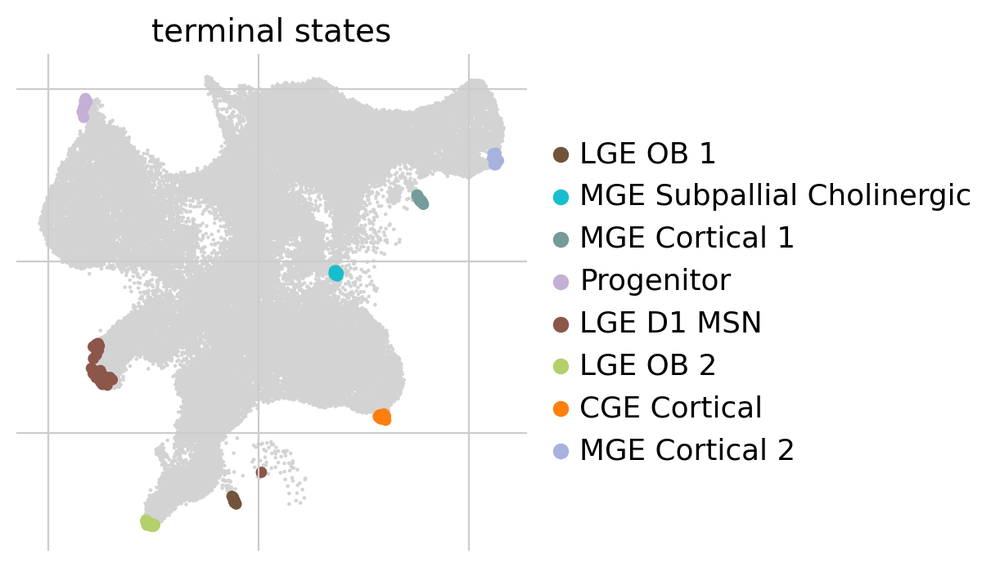

In [48]:
g.predict_terminal_states()
g.plot_macrostates(which="terminal", legend_loc="right", s=100)

Adding `adata.obs['init_states_fwd']`
       `adata.obs['init_states_fwd_probs']`
       `.initial_states`
       `.initial_states_probabilities`
       `.initial_states_memberships
    Finish`


/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wyn

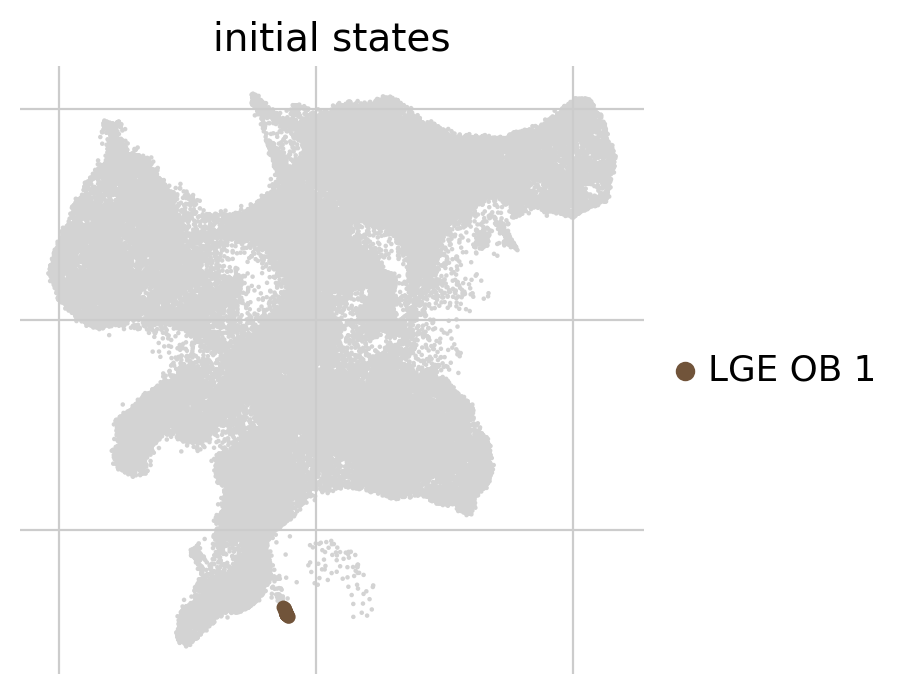

In [49]:
g.predict_initial_states(allow_overlap = True)
g.plot_macrostates(which="initial", legend_loc="right", s=100)

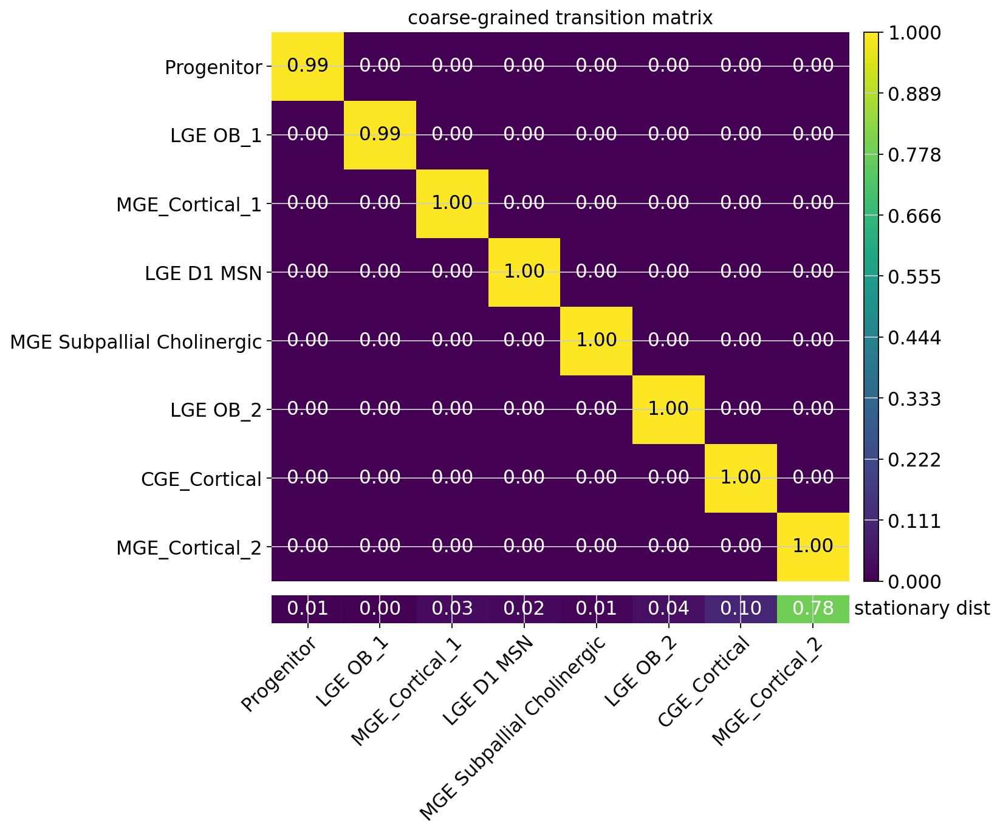

In [50]:
g.plot_coarse_T()


Computing fate probabilities


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:08<00:00,  1.07s/]
[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:09)


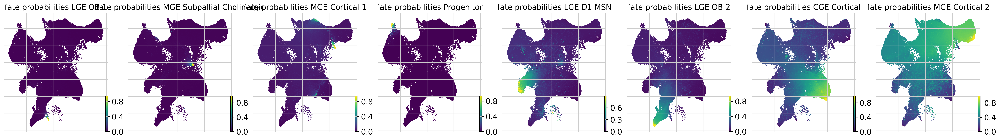

In [51]:
g.compute_fate_probabilities()
g.plot_fate_probabilities(same_plot=False)

Solving TSP for `8` states


/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/wyn

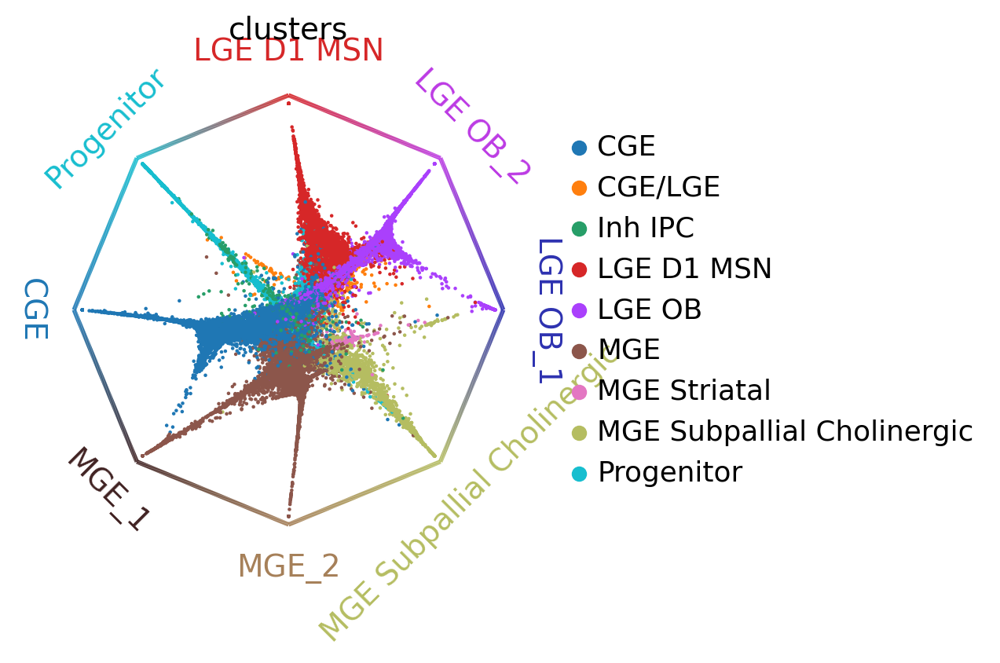

In [22]:
cr.pl.circular_projection(adata, keys=["clusters", "clusters_fine"], legend_loc="right")


In [1]:
print('hello')

hello


In [9]:
g2 = cr.estimators.GPCCA(pk)
print(g2)

GPCCA[kernel=PseudotimeKernel[n=104681], initial_states=None, terminal_states=None]


Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[18, 21, 25, 29, 31, 33, 37, 43, 45, 48, 53, 58, 60, 62, 66, 72, 74, 77, 80, 82, 84, 86, 88, 90, 93, 96, 98, 100]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:04:55)


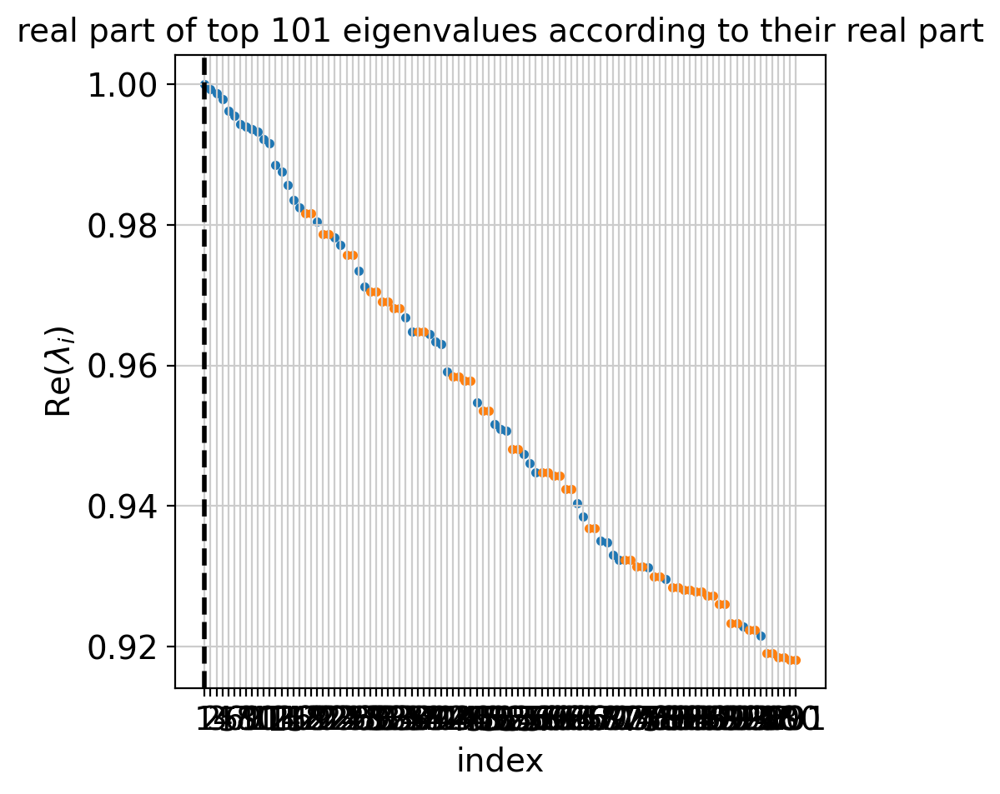

In [10]:
g2.compute_schur(n_components = 100)
g2.plot_spectrum(real_only=True )

Computing `30` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (1:04:03)


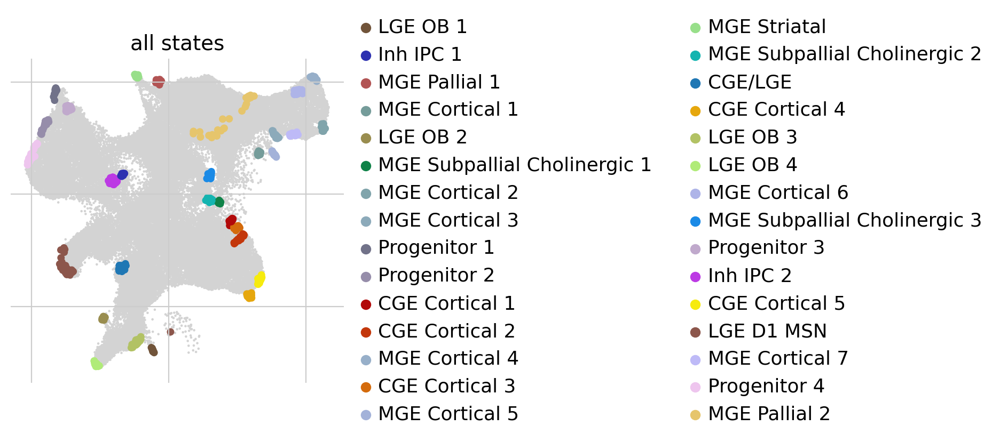

In [16]:
g2.compute_macrostates(n_states=30, cluster_key="clusters")
g2.plot_macrostates(which="all", legend_loc="right", s=100)

In [17]:
g2.write("/wynton/group/paredes/Aunoy/g230.pickle")

Writing `GPCCA[kernel=PseudotimeKernel[n=104681], initial_states=None, terminal_states=None]` to `/wynton/group/paredes/Aunoy/g230.pickle`


In [1]:
#g2 = cr.estimators.GPCCA.read("/wynton/group/paredes/Aunoy/g230.pickle")
g2 = cr.estimators.GPCCA.read("/wynton/group/paredes/Aunoy/monocle_data_g2_estimator.pickle")

NameError: name 'cr' is not defined

/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


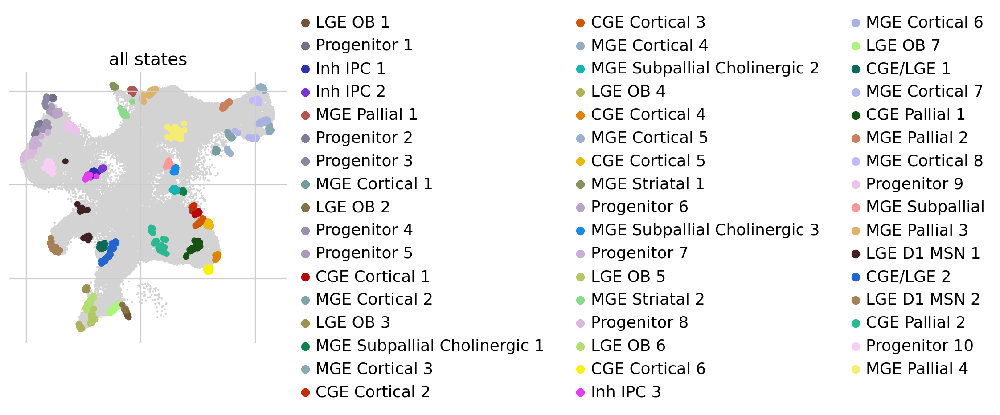

In [7]:
g2.plot_macrostates(which="all", legend_loc="right", s=100)

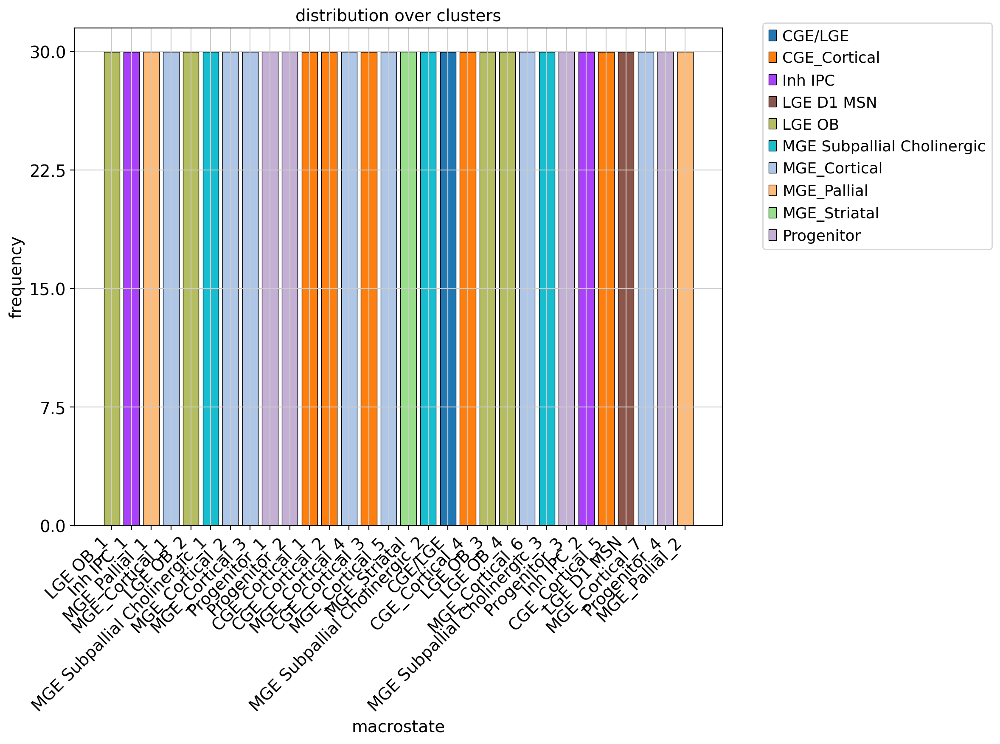

In [9]:
g2.plot_macrostate_composition(key="clusters", figsize=(12, 9))

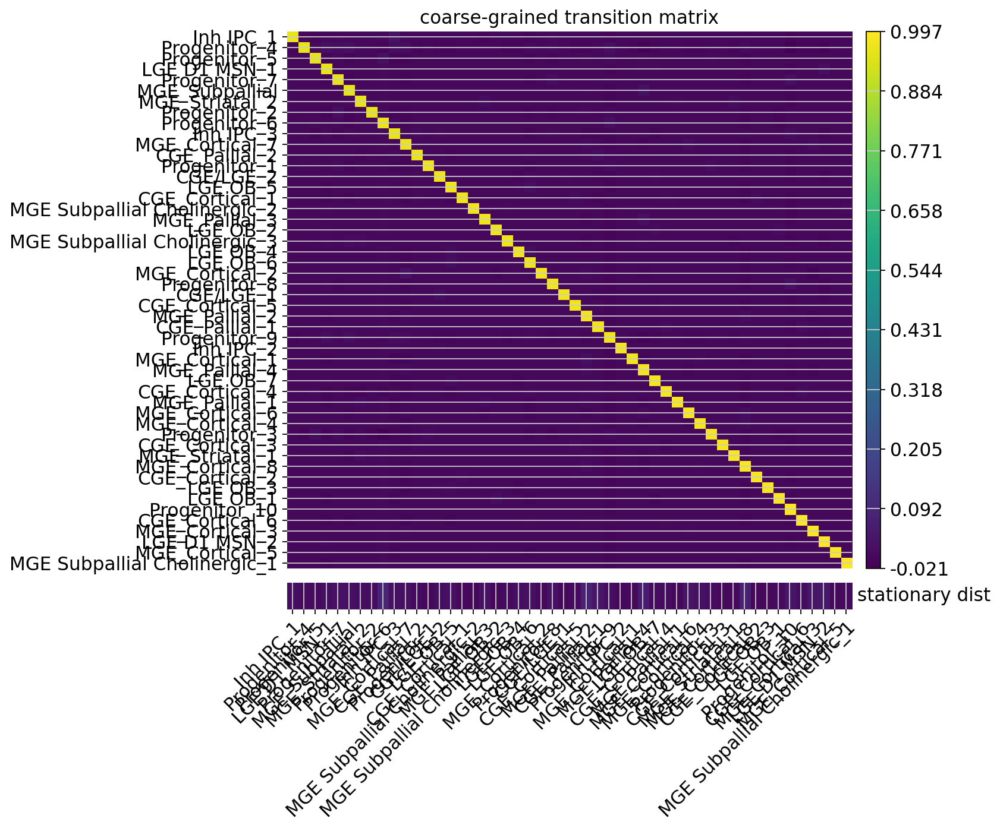

In [3]:
g2.plot_coarse_T(annotate=False)

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


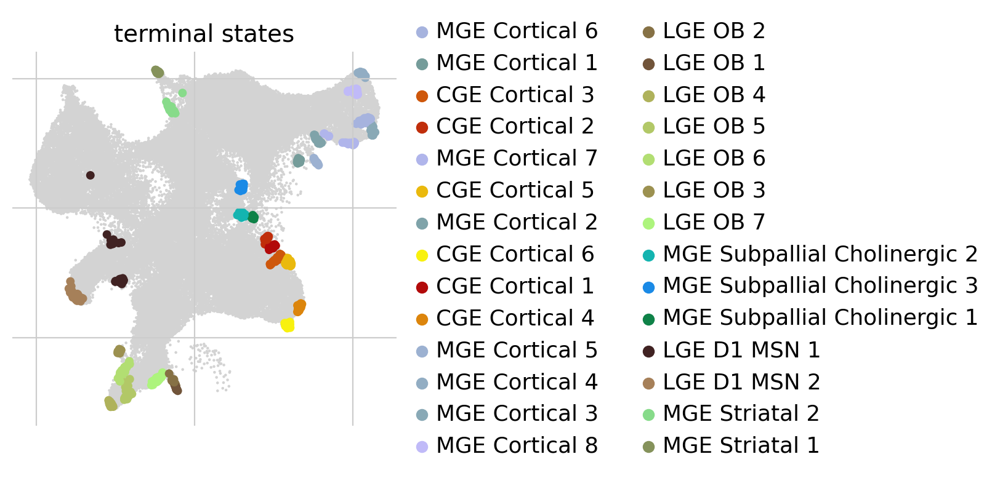

In [8]:
g2.set_terminal_states(states= term_states, allow_overlap = True, cluster_key = "cluster")
g2.plot_macrostates(which="terminal", legend_loc="right", s=100)

In [8]:
in_states = [x for x in g2.macrostates.unique() if "Progenitor" in str(x)]

In [9]:
ctx_term_states = [x for x in g2.macrostates.unique() if "Cortical" in str(x)]
ob_term_states = [x for x in g2.macrostates.unique() if "OB" in str(x)]
chol_term_states = [x for x in g2.macrostates.unique() if "Cholinergic" in str(x)]
msn_term_states = [x for x in g2.macrostates.unique() if "MSN" in str(x)]
str_term_states = [x for x in g2.macrostates.unique() if "Striatal" in str(x)]

In [10]:
term_states = ctx_term_states + ob_term_states + chol_term_states + msn_term_states + str_term_states
term_states

['MGE_Cortical_6',
 'MGE_Cortical_1',
 'CGE_Cortical_3',
 'CGE_Cortical_2',
 'MGE_Cortical_7',
 'CGE_Cortical_5',
 'MGE_Cortical_2',
 'CGE_Cortical_6',
 'CGE_Cortical_1',
 'CGE_Cortical_4',
 'MGE_Cortical_5',
 'MGE_Cortical_4',
 'MGE_Cortical_3',
 'MGE_Cortical_8',
 'LGE OB_2',
 'LGE OB_1',
 'LGE OB_4',
 'LGE OB_5',
 'LGE OB_6',
 'LGE OB_3',
 'LGE OB_7',
 'MGE Subpallial Cholinergic_2',
 'MGE Subpallial Cholinergic_3',
 'MGE Subpallial Cholinergic_1',
 'LGE D1 MSN_1',
 'LGE D1 MSN_2',
 'MGE_Striatal_2',
 'MGE_Striatal_1']

Adding `adata.obs['init_states_fwd']`
       `adata.obs['init_states_fwd_probs']`
       `.initial_states`
       `.initial_states_probabilities`
       `.initial_states_memberships
    Finish`


/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


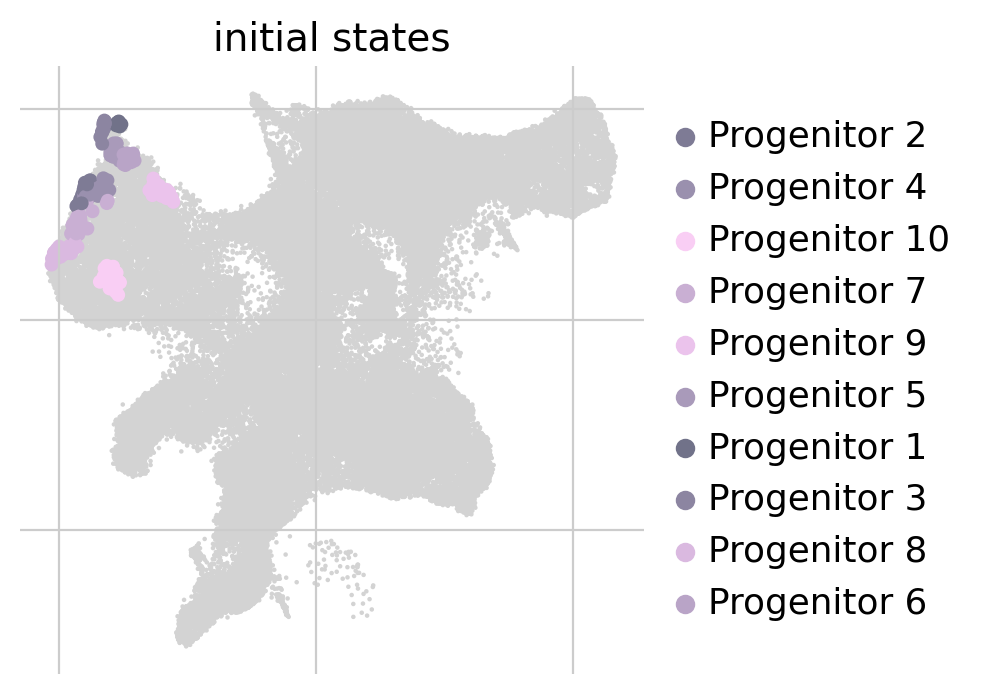

In [11]:
g2.set_initial_states(states=in_states, allow_overlap = True)
g2.plot_macrostates(which="initial", legend_loc="right", s=100)

In [45]:
g2.compute_fate_probabilities()
g2.plot_fate_probabilities(same_plot=False,
                          states = [x for x in g2.terminal_states.unique() if "MGE" in str(x)])

Computing fate probabilities


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:14<00:00,  1.92/s]
[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:15)


In [13]:
g2.plot_fate_probabilities(same_plot=True, [x for x in g2.terminal_states.unique() if "MGE" in str(x)])

SyntaxError: positional argument follows keyword argument (3541185842.py, line 1)

In [11]:
[x for x in g2.terminal_states.unique() if "MGE" in str(x)]

['MGE_Cortical_6',
 'MGE_Striatal_2',
 'MGE_Cortical_1',
 'MGE_Cortical_7',
 'MGE_Striatal_1',
 'MGE_Cortical_2',
 'MGE Subpallial Cholinergic_2',
 'MGE Subpallial Cholinergic_3',
 'MGE Subpallial Cholinergic_1',
 'MGE_Cortical_5',
 'MGE_Cortical_4',
 'MGE_Cortical_3',
 'MGE_Cortical_8']

In [14]:
cr.pl.circular_projection(adata, keys=["clusters"], legend_loc="right")

NameError: name 'adata' is not defined

In [15]:
g2

GPCCA[kernel=PseudotimeKernel[n=104681], initial_states=['Progenitor_1', 'Progenitor_10', 'Progenitor_2', 'Progenitor_3', 'Progenitor_4', 'Progenitor_5', 'Progenitor_6', 'Progenitor_7', 'Progenitor_8', 'Progenitor_9'], terminal_states=['CGE_Cortical_1', 'CGE_Cortical_2', 'CGE_Cortical_3', 'CGE_Cortical_4', 'CGE_Cortical_5', 'CGE_Cortical_6', 'LGE D1 MSN_1', 'LGE D1 MSN_2', 'LGE OB_1', 'LGE OB_2', 'LGE OB_3', 'LGE OB_4', 'LGE OB_5', 'LGE OB_6', 'LGE OB_7', 'MGE Subpallial Cholinergic_1', 'MGE Subpallial Cholinergic_2', 'MGE Subpallial Cholinergic_3', 'MGE_Cortical_1', 'MGE_Cortical_2', 'MGE_Cortical_3', 'MGE_Cortical_4', 'MGE_Cortical_5', 'MGE_Cortical_6', 'MGE_Cortical_7', 'MGE_Cortical_8', 'MGE_Striatal_1', 'MGE_Striatal_2']]

In [16]:
g2.fate_probabilities

MGE_Cortical_6,MGE_Cortical_1,CGE_Cortical_3,CGE_Cortical_2,MGE_Cortical_7,CGE_Cortical_5,MGE_Cortical_2,CGE_Cortical_6,CGE_Cortical_1,CGE_Cortical_4,MGE_Cortical_5,MGE_Cortical_4,MGE_Cortical_3,MGE_Cortical_8,LGE OB_2,LGE OB_1,LGE OB_4,LGE OB_5,LGE OB_6,LGE OB_3,LGE OB_7,MGE Subpallial Cholinergic_2,MGE Subpallial Cholinergic_3,MGE Subpallial Cholinergic_1,LGE D1 MSN_1,LGE D1 MSN_2,MGE_Striatal_2,MGE_Striatal_1
0.146181,0.003448,0.007788,0.006538,0.055444,0.015865,0.028256,0.061423,0.005729,0.048336,0.053508,0.130616,0.061989,0.183201,0.007152,0.000195,0.011636,0.028552,0.026679,0.004591,0.020633,0.003995,0.002987,0.002062,0.005385,0.032442,0.020465,0.024902
0.130582,0.003265,0.010086,0.008012,0.048810,0.020481,0.024349,0.081963,0.007413,0.063674,0.045239,0.118192,0.055249,0.165193,0.004065,0.000178,0.011502,0.031057,0.029909,0.006321,0.023674,0.005863,0.003604,0.002994,0.008267,0.051653,0.017679,0.020730
0.141229,0.003321,0.008800,0.008083,0.053376,0.017876,0.027049,0.065998,0.006536,0.052145,0.050660,0.126643,0.059839,0.177456,0.006528,0.000183,0.013505,0.033255,0.030613,0.004796,0.023216,0.004028,0.002976,0.002082,0.005516,0.032523,0.019115,0.022653
0.135688,0.003361,0.008111,0.007016,0.051397,0.016595,0.026120,0.063310,0.006002,0.049889,0.048790,0.121538,0.057633,0.170261,0.010650,0.000200,0.017784,0.041066,0.037787,0.005445,0.027759,0.003953,0.003092,0.002054,0.006020,0.033466,0.019461,0.025550
0.124503,0.003118,0.011393,0.008714,0.046288,0.022368,0.022932,0.089677,0.008087,0.069557,0.041643,0.112949,0.052554,0.157774,0.003912,0.000182,0.012531,0.033939,0.032783,0.006742,0.026023,0.006072,0.003746,0.003000,0.009217,0.056640,0.015566,0.018094
0.124340,0.003114,0.011378,0.008723,0.046235,0.022410,0.022885,0.089832,0.008103,0.069687,0.041536,0.112845,0.052498,0.157622,0.003872,0.000175,0.012569,0.034046,0.032886,0.006758,0.026111,0.006048,0.003756,0.002994,0.009263,0.057028,0.015379,0.017909
0.125108,0.003139,0.010865,0.008552,0.046553,0.022118,0.022976,0.088904,0.007992,0.068990,0.041771,0.113624,0.052869,0.158669,0.003770,0.000164,0.012311,0.033368,0.032195,0.006647,0.025641,0.005922,0.003810,0.002912,0.009295,0.058292,0.015475,0.018071
0.121814,0.002644,0.018309,0.023017,0.044927,0.036960,0.022161,0.107091,0.014326,0.087189,0.038034,0.112739,0.051282,0.156707,0.003384,0.000115,0.010451,0.027911,0.026153,0.004571,0.022013,0.004941,0.002176,0.002836,0.005061,0.031012,0.010816,0.011359
0.143464,0.003434,0.009849,0.007665,0.053340,0.016849,0.027306,0.066048,0.006186,0.051380,0.052179,0.127885,0.060249,0.180192,0.007544,0.000753,0.009054,0.024116,0.023034,0.004972,0.018436,0.004552,0.002883,0.002547,0.005454,0.033541,0.023512,0.033575
0.150644,0.003488,0.007424,0.006174,0.057320,0.015064,0.029404,0.058618,0.005444,0.046125,0.056797,0.134203,0.063890,0.188360,0.005368,0.000203,0.009765,0.024406,0.022937,0.004220,0.017950,0.003879,0.002880,0.002015,0.004902,0.030282,0.022267,0.025972


In [22]:
sum(g2.fate_probabilities.Lineage[1, :])

AttributeError: 'Lineage' object has no attribute 'Lineage'

In [24]:
my_df = pd.DataFrame(g2.fate_probabilities, columns = g2.fate_probabilities.names, index = adata.obs.index)

In [63]:
sum(adata.obs["dataset"] == "arc")

20363

In [25]:
my_df

,MGE_Cortical_6,MGE_Cortical_1,CGE_Cortical_3,CGE_Cortical_2,MGE_Cortical_7,CGE_Cortical_5,MGE_Cortical_2,CGE_Cortical_6,CGE_Cortical_1,CGE_Cortical_4,...,LGE OB_6,LGE OB_3,LGE OB_7,MGE Subpallial Cholinergic_2,MGE Subpallial Cholinergic_3,MGE Subpallial Cholinergic_1,LGE D1 MSN_1,LGE D1 MSN_2,MGE_Striatal_2,MGE_Striatal_1
barcode,,,,,,,,,,,,,,,,,,,,,
2018-023_Arc_CAGATACCAACCGTGC-1_1,0.146181,0.003448,0.007788,0.006538,0.055444,0.015865,0.028256,0.061423,0.005729,0.048336,...,0.026679,0.004591,0.020633,0.003995,0.002987,0.002062,0.005385,0.032442,0.020465,0.024902
2018-023_Arc_GGGCTACTCGCCTCTA-1_1,0.130582,0.003265,0.010086,0.008012,0.048810,0.020481,0.024349,0.081963,0.007413,0.063674,...,0.029909,0.006321,0.023674,0.005863,0.003604,0.002994,0.008267,0.051653,0.017679,0.020730
2018-023_Arc_TCTAACTCACTTCAGA-1_1,0.141229,0.003321,0.008800,0.008083,0.053376,0.017876,0.027049,0.065998,0.006536,0.052145,...,0.030613,0.004796,0.023216,0.004028,0.002976,0.002082,0.005516,0.032523,0.019115,0.022653
2018-023_Arc_CCTCATGTCGACATCA-1_1,0.135688,0.003361,0.008111,0.007016,0.051397,0.016595,0.026120,0.063310,0.006002,0.049889,...,0.037787,0.005445,0.027759,0.003953,0.003092,0.002054,0.006020,0.033466,0.019461,0.025550
2018-023_Arc_TCTTTGAAGATACGAT-1_1,0.124503,0.003118,0.011393,0.008714,0.046288,0.022368,0.022932,0.089677,0.008087,0.069557,...,0.032783,0.006742,0.026023,0.006072,0.003746,0.003000,0.009217,0.056640,0.015566,0.018094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCACGATAGG-1_15_4,0.012472,0.000379,0.005526,0.005429,0.004468,0.017908,0.002192,0.235217,0.010429,0.644896,...,0.003471,0.000593,0.002662,0.000623,0.000257,0.000326,0.000666,0.003914,0.001160,0.001797
TTTGGAGTCGACTCCT-1_15_4,0.303099,0.001407,0.000877,0.000809,0.069534,0.001751,0.012476,0.007466,0.000678,0.006201,...,0.001822,0.000347,0.001511,0.000699,0.000352,0.000520,0.000553,0.005097,0.001616,0.001410
TTTGGTTAGATGGGCT-1_15_4,0.033668,0.001102,0.056793,0.020113,0.012422,0.065247,0.007025,0.336062,0.018555,0.254875,...,0.009702,0.001675,0.007918,0.001728,0.000688,0.000886,0.001734,0.009998,0.003062,0.004474


In [28]:
my_df[(my_df<1-0.05)]

,MGE_Cortical_6,MGE_Cortical_1,CGE_Cortical_3,CGE_Cortical_2,MGE_Cortical_7,CGE_Cortical_5,MGE_Cortical_2,CGE_Cortical_6,CGE_Cortical_1,CGE_Cortical_4,...,LGE OB_6,LGE OB_3,LGE OB_7,MGE Subpallial Cholinergic_2,MGE Subpallial Cholinergic_3,MGE Subpallial Cholinergic_1,LGE D1 MSN_1,LGE D1 MSN_2,MGE_Striatal_2,MGE_Striatal_1
barcode,,,,,,,,,,,,,,,,,,,,,
2018-023_Arc_CAGATACCAACCGTGC-1_1,0.146181,0.003448,0.007788,0.006538,0.055444,0.015865,0.028256,0.061423,0.005729,0.048336,...,0.026679,0.004591,0.020633,0.003995,0.002987,0.002062,0.005385,0.032442,0.020465,0.024902
2018-023_Arc_GGGCTACTCGCCTCTA-1_1,0.130582,0.003265,0.010086,0.008012,0.048810,0.020481,0.024349,0.081963,0.007413,0.063674,...,0.029909,0.006321,0.023674,0.005863,0.003604,0.002994,0.008267,0.051653,0.017679,0.020730
2018-023_Arc_TCTAACTCACTTCAGA-1_1,0.141229,0.003321,0.008800,0.008083,0.053376,0.017876,0.027049,0.065998,0.006536,0.052145,...,0.030613,0.004796,0.023216,0.004028,0.002976,0.002082,0.005516,0.032523,0.019115,0.022653
2018-023_Arc_CCTCATGTCGACATCA-1_1,0.135688,0.003361,0.008111,0.007016,0.051397,0.016595,0.026120,0.063310,0.006002,0.049889,...,0.037787,0.005445,0.027759,0.003953,0.003092,0.002054,0.006020,0.033466,0.019461,0.025550
2018-023_Arc_TCTTTGAAGATACGAT-1_1,0.124503,0.003118,0.011393,0.008714,0.046288,0.022368,0.022932,0.089677,0.008087,0.069557,...,0.032783,0.006742,0.026023,0.006072,0.003746,0.003000,0.009217,0.056640,0.015566,0.018094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCACGATAGG-1_15_4,0.012472,0.000379,0.005526,0.005429,0.004468,0.017908,0.002192,0.235217,0.010429,0.644896,...,0.003471,0.000593,0.002662,0.000623,0.000257,0.000326,0.000666,0.003914,0.001160,0.001797
TTTGGAGTCGACTCCT-1_15_4,0.303099,0.001407,0.000877,0.000809,0.069534,0.001751,0.012476,0.007466,0.000678,0.006201,...,0.001822,0.000347,0.001511,0.000699,0.000352,0.000520,0.000553,0.005097,0.001616,0.001410
TTTGGTTAGATGGGCT-1_15_4,0.033668,0.001102,0.056793,0.020113,0.012422,0.065247,0.007025,0.336062,0.018555,0.254875,...,0.009702,0.001675,0.007918,0.001728,0.000688,0.000886,0.001734,0.009998,0.003062,0.004474


In [29]:
my_df<1

,MGE_Cortical_6,MGE_Cortical_1,CGE_Cortical_3,CGE_Cortical_2,MGE_Cortical_7,CGE_Cortical_5,MGE_Cortical_2,CGE_Cortical_6,CGE_Cortical_1,CGE_Cortical_4,...,LGE OB_6,LGE OB_3,LGE OB_7,MGE Subpallial Cholinergic_2,MGE Subpallial Cholinergic_3,MGE Subpallial Cholinergic_1,LGE D1 MSN_1,LGE D1 MSN_2,MGE_Striatal_2,MGE_Striatal_1
barcode,,,,,,,,,,,,,,,,,,,,,
2018-023_Arc_CAGATACCAACCGTGC-1_1,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
2018-023_Arc_GGGCTACTCGCCTCTA-1_1,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
2018-023_Arc_TCTAACTCACTTCAGA-1_1,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
2018-023_Arc_CCTCATGTCGACATCA-1_1,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
2018-023_Arc_TCTTTGAAGATACGAT-1_1,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCACGATAGG-1_15_4,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
TTTGGAGTCGACTCCT-1_15_4,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
TTTGGTTAGATGGGCT-1_15_4,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True


In [38]:
### Here I am trying to see if I can compute the probabilities of progenitors going to CGE and LGE subpallial

mge_sp_states = [x for x in g2.macrostates.unique() if "MGE_Subpallial" in str(x) and "Cholinergic" not in str(x)]
cge_sp_states = [x for x in g2.macrostates.unique() if "CGE Subpallial" in str(x)]
lge_sp_states = [x for x in g2.macrostates.unique() if "LGE_D1" in str(x)]

In [39]:
cge_sp_states

[]

In [40]:
 [x for x in g2.macrostates.unique() ]

[nan,
 'Inh IPC_3',
 'LGE OB_2',
 'LGE OB_1',
 'Inh IPC_1',
 'MGE_Cortical_6',
 'MGE_Striatal_2',
 'MGE_Pallial_4',
 'MGE_Cortical_1',
 'CGE_Cortical_3',
 'LGE OB_4',
 'CGE_Cortical_2',
 'LGE OB_5',
 'LGE OB_6',
 'CGE/LGE_1',
 'CGE_Pallial_1',
 'LGE OB_3',
 'LGE OB_7',
 'CGE_Pallial_2',
 'MGE_Pallial_3',
 'CGE/LGE_2',
 'MGE_Cortical_7',
 'LGE D1 MSN_1',
 'MGE_Pallial_1',
 'MGE_Striatal_1',
 'CGE_Cortical_5',
 'MGE_Cortical_2',
 'CGE_Cortical_6',
 'MGE Subpallial Cholinergic_2',
 'MGE Subpallial Cholinergic_3',
 'Progenitor_2',
 'Progenitor_4',
 'Progenitor_10',
 'Progenitor_7',
 'MGE Subpallial Cholinergic_1',
 'Progenitor_9',
 'MGE_Subpallial',
 'Progenitor_5',
 'Progenitor_1',
 'Progenitor_3',
 'Progenitor_8',
 'Progenitor_6',
 'LGE D1 MSN_2',
 'CGE_Cortical_1',
 'CGE_Cortical_4',
 'MGE_Cortical_5',
 'Inh IPC_2',
 'MGE_Pallial_2',
 'MGE_Cortical_4',
 'MGE_Cortical_3',
 'MGE_Cortical_8']

In [42]:
adata

AnnData object with n_obs × n_vars = 104681 × 42862
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'unintegrated_clusters', 'seurat_clusters', 'celltypes', 'scvi_clusters', 'class', 'dataset', 'RNA_snn_res.0.5', 'ident', 'percent.mt', 'doublets', 'sample', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'cellnames', 'celltypes_final', 'celltypes_sub_final', 'stages_final', 'age', 'scvi_class', 'monocle_pseudotime', 'barcode', 'UMAP_1', 'UMAP_2', 'scvi_fate'
    uns: 'scvi_class_colors'
    obsm: 'X_pca', 'X_scvi', 'X_umap'

In [46]:
cr.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["Progenitor"],
    cluster_key="scvi_fate",
    clusters="CGE_Subpallial",
)

KeyError: "Unable to find lineage data in `adata.obsm['lineages_fwd']`."

In [73]:
mge_pallial_bool = adata.obs["scvi_fate"] == "CGE_Subpallial"

In [74]:
sum(mge_pallial_bool)

9717

In [75]:
types_df = pd.DataFrame(g2.macrostates[mge_pallial_bool]
).value_counts().reset_index(name='Count')

In [76]:
types_df

,0,Count
0,LGE OB_1,0
1,MGE_Cortical_7,0
2,Progenitor_7,0
3,LGE OB_5,0
4,MGE_Striatal_2,0
5,Progenitor_8,0
6,LGE OB_6,0
7,CGE_Cortical_6,0
8,Inh IPC_3,0
9,MGE_Cortical_6,0


In [72]:
adata.obs['scvi_fate'].unique()

['CGE_Subpallial', 'Inh IPC', 'MGE Subpallial Cholinergic', 'Progenitor', 'MGE_Pallial', ..., 'CGE_Pallial', 'CGE/LGE', 'LGE D1 MSN', 'CGE_Cortical', 'LGE D1 MSN PDYN']
Length: 14
Categories (14, object): ['CGE/LGE', 'CGE_Cortical', 'CGE_Pallial', 'CGE_Subpallial', ..., 'MGE_Pallial', 'MGE_Striatal', 'MGE_Subpallial', 'Progenitor']

In [83]:
g2.fate_probabilities[mge_pallial_bool]

MGE_Cortical_6,MGE_Cortical_1,CGE_Cortical_3,CGE_Cortical_2,MGE_Cortical_7,CGE_Cortical_5,MGE_Cortical_2,CGE_Cortical_6,CGE_Cortical_1,CGE_Cortical_4,MGE_Cortical_5,MGE_Cortical_4,MGE_Cortical_3,MGE_Cortical_8,LGE OB_2,LGE OB_1,LGE OB_4,LGE OB_5,LGE OB_6,LGE OB_3,LGE OB_7,MGE Subpallial Cholinergic_2,MGE Subpallial Cholinergic_3,MGE Subpallial Cholinergic_1,LGE D1 MSN_1,LGE D1 MSN_2,MGE_Striatal_2,MGE_Striatal_1
0.146181,0.003448,0.007788,0.006538,0.055444,0.015865,0.028256,0.061423,0.005729,0.048336,0.053508,0.130616,0.061989,0.183201,0.007152,0.000195,0.011636,0.028552,0.026679,0.004591,0.020633,0.003995,0.002987,0.002062,0.005385,0.032442,0.020465,0.024902
0.141229,0.003321,0.008800,0.008083,0.053376,0.017876,0.027049,0.065998,0.006536,0.052145,0.050660,0.126643,0.059839,0.177456,0.006528,0.000183,0.013505,0.033255,0.030613,0.004796,0.023216,0.004028,0.002976,0.002082,0.005516,0.032523,0.019115,0.022653
0.135688,0.003361,0.008111,0.007016,0.051397,0.016595,0.026120,0.063310,0.006002,0.049889,0.048790,0.121538,0.057633,0.170261,0.010650,0.000200,0.017784,0.041066,0.037787,0.005445,0.027759,0.003953,0.003092,0.002054,0.006020,0.033466,0.019461,0.025550
0.121814,0.002644,0.018309,0.023017,0.044927,0.036960,0.022161,0.107091,0.014326,0.087189,0.038034,0.112739,0.051282,0.156707,0.003384,0.000115,0.010451,0.027911,0.026153,0.004571,0.022013,0.004941,0.002176,0.002836,0.005061,0.031012,0.010816,0.011359
0.150644,0.003488,0.007424,0.006174,0.057320,0.015064,0.029404,0.058618,0.005444,0.046125,0.056797,0.134203,0.063890,0.188360,0.005368,0.000203,0.009765,0.024406,0.022937,0.004220,0.017950,0.003879,0.002880,0.002015,0.004902,0.030282,0.022267,0.025972
0.154636,0.003508,0.007984,0.006323,0.058788,0.015963,0.030014,0.060370,0.005544,0.047526,0.057375,0.137954,0.065487,0.193684,0.004287,0.000175,0.008100,0.020707,0.019552,0.003779,0.015501,0.003620,0.002647,0.001837,0.004269,0.027021,0.019391,0.023956
0.154683,0.003613,0.007284,0.006011,0.058420,0.014160,0.029856,0.055591,0.005205,0.043736,0.056760,0.137763,0.065236,0.193527,0.004937,0.000300,0.008015,0.021080,0.020001,0.004119,0.016208,0.003912,0.002769,0.002100,0.004649,0.029618,0.022603,0.027844
0.139255,0.003200,0.009153,0.007728,0.052647,0.018640,0.026652,0.072814,0.006880,0.057174,0.050478,0.124922,0.059043,0.175031,0.004679,0.000160,0.012238,0.032062,0.030328,0.005503,0.024274,0.004118,0.002777,0.002092,0.006549,0.035852,0.016905,0.018847
0.131032,0.002857,0.013730,0.012872,0.049088,0.027758,0.024464,0.096968,0.009880,0.077325,0.043634,0.118812,0.055685,0.165786,0.003567,0.000127,0.011065,0.029514,0.027532,0.004740,0.023496,0.004096,0.002269,0.002157,0.005137,0.030549,0.012352,0.013506
0.137491,0.003311,0.009230,0.007665,0.051554,0.018876,0.025769,0.074082,0.006849,0.057939,0.047050,0.123952,0.058146,0.173550,0.005087,0.000174,0.011442,0.029783,0.028269,0.005331,0.022564,0.004974,0.003448,0.002546,0.007370,0.046118,0.017354,0.020078


In [84]:
g2

GPCCA[kernel=PseudotimeKernel[n=104681], initial_states=['Progenitor_1', 'Progenitor_10', 'Progenitor_2', 'Progenitor_3', 'Progenitor_4', 'Progenitor_5', 'Progenitor_6', 'Progenitor_7', 'Progenitor_8', 'Progenitor_9'], terminal_states=['CGE_Cortical_1', 'CGE_Cortical_2', 'CGE_Cortical_3', 'CGE_Cortical_4', 'CGE_Cortical_5', 'CGE_Cortical_6', 'LGE D1 MSN_1', 'LGE D1 MSN_2', 'LGE OB_1', 'LGE OB_2', 'LGE OB_3', 'LGE OB_4', 'LGE OB_5', 'LGE OB_6', 'LGE OB_7', 'MGE Subpallial Cholinergic_1', 'MGE Subpallial Cholinergic_2', 'MGE Subpallial Cholinergic_3', 'MGE_Cortical_1', 'MGE_Cortical_2', 'MGE_Cortical_3', 'MGE_Cortical_4', 'MGE_Cortical_5', 'MGE_Cortical_6', 'MGE_Cortical_7', 'MGE_Cortical_8', 'MGE_Striatal_1', 'MGE_Striatal_2']]

In [8]:
# In this block, I am going to to merge the terminal probabilities into something that makes sense

### Here I am trying to see if I can compute the probabilities of progenitors going to CGE and LGE subpallial

mge_ctx = [x for x in g2.macrostates.unique() if "MGE_Cortical" in str(x) and "Cholinergic" not in str(x)]
mge_subp = [x for x in g2.macrostates.unique() if "MGE Subpallial" in str(x) and "Cholinergic" in str(x)]
mge_str = [x for x in g2.macrostates.unique() if "MGE_Striatal" in str(x)]
cge_ctx = [x for x in g2.macrostates.unique() if "CGE_Cortical" in str(x)]
lge_ob_states = [x for x in g2.macrostates.unique() if "LGE OB" in str(x)]
lge_MSN_states = [x for x in g2.macrostates.unique() if "LGE D1" in str(x)]

In [9]:
', '.join(sorted(mge_ctx)[0:2])

'MGE_Cortical_1, MGE_Cortical_2'

In [10]:
terminal_states_merged = [', '.join(sorted(mge_ctx)),  ', '.join(sorted(mge_subp)), 
                          ', '.join(sorted(mge_str)), ', '.join(sorted(cge_ctx)), 
                          ', '.join(sorted(lge_ob_states)), ', '.join(sorted(lge_MSN_states))]
terminal_states_merged

['MGE_Cortical_1, MGE_Cortical_2, MGE_Cortical_3, MGE_Cortical_4, MGE_Cortical_5, MGE_Cortical_6, MGE_Cortical_7, MGE_Cortical_8',
 'MGE Subpallial Cholinergic_1, MGE Subpallial Cholinergic_2, MGE Subpallial Cholinergic_3',
 'MGE_Striatal_1, MGE_Striatal_2',
 'CGE_Cortical_1, CGE_Cortical_2, CGE_Cortical_3, CGE_Cortical_4, CGE_Cortical_5, CGE_Cortical_6',
 'LGE OB_1, LGE OB_2, LGE OB_3, LGE OB_4, LGE OB_5, LGE OB_6, LGE OB_7',
 'LGE D1 MSN_1, LGE D1 MSN_2']

In [11]:
terminal_states_merged[5] = 'LGE D1 MSN_2'

In [12]:
prog_states = [x for x in g2.macrostates.unique() if "Progenitor" in str(x)]
in_states = [x for x in g2.macrostates.unique() if "IPC" in str(x)]

In [13]:
initial_states_merged = [', '.join(sorted(prog_states)), ', '.join(sorted(in_states))]
initial_states_merged

['Progenitor_1, Progenitor_10, Progenitor_2, Progenitor_3, Progenitor_4, Progenitor_5, Progenitor_6, Progenitor_7, Progenitor_8, Progenitor_9',
 'Inh IPC_1, Inh IPC_2, Inh IPC_3']

In [14]:
initial_state_names = ["Progenitor", "Inh IPC"]
terminal_state_names = ["MGE_Ctx", "MGE_Chol", "MGE_Str", "CGE_Ctx", "LGE_OB", "LGE_MSN"]

In [15]:
prog_states[3:6]

['Progenitor_7', 'Progenitor_9', 'Progenitor_5']

Adding `adata.obs['init_states_fwd']`
       `adata.obs['init_states_fwd_probs']`
       `.initial_states`
       `.initial_states_probabilities`
       `.initial_states_memberships
    Finish`


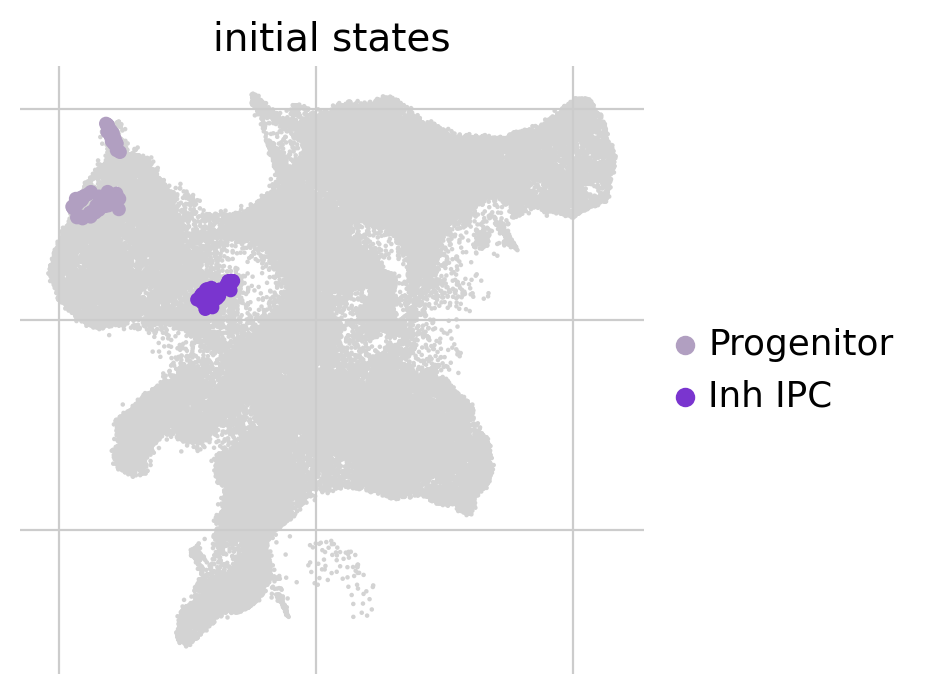

In [16]:
g2.set_initial_states(states=initial_states_merged, n_cells = 100, allow_overlap = True)
g2.rename_initial_states(dict(zip(initial_states_merged,initial_state_names)))
g2.plot_macrostates(which="initial", legend_loc="right", s=100)

In [17]:
#terminal_states_merged = [x for x in g2.macrostates.unique() if "Pallial" in str(x)]

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


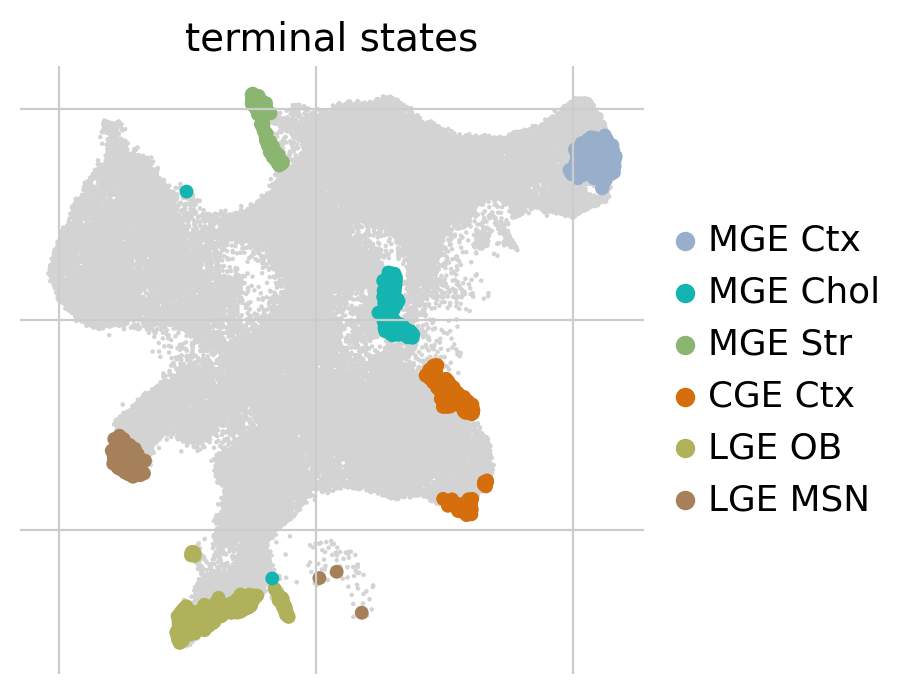

In [18]:
g2.set_terminal_states(states=terminal_states_merged, n_cells = 500, allow_overlap = True)
g2.rename_terminal_states(dict(zip(terminal_states_merged,terminal_state_names)))
g2.plot_macrostates(which="terminal", legend_loc="right", s=100)

Computing fate probabilities


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:06<00:00,  1.10s/]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:06)


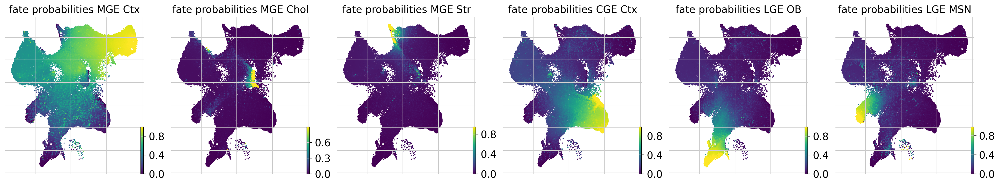

In [19]:
g2.compute_fate_probabilities()
g2.plot_fate_probabilities(same_plot=False)

/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/wynton/home/paredes/aunoy/miniforge3/envs/cell_rank/lib/python3.11/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


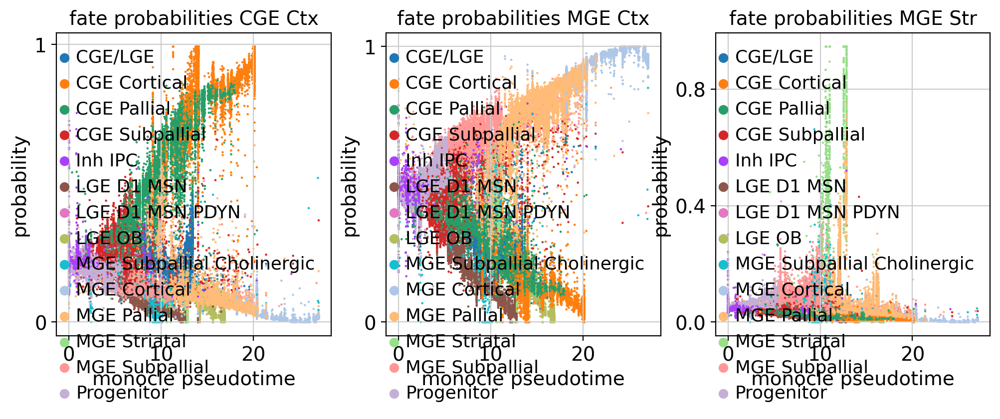

In [108]:
g2.plot_fate_probabilities(same_plot=False, mode = "time",
                          time_key = "monocle_pseudotime",
                          states = ['CGE_Ctx', "MGE_Ctx", "MGE_Str"])

In [20]:
g2_adata = g2.to_adata()

In [197]:
adata.obsm

AnnData object with n_obs × n_vars = 104681 × 42862
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'unintegrated_clusters', 'seurat_clusters', 'celltypes', 'scvi_clusters', 'class', 'dataset', 'RNA_snn_res.0.5', 'ident', 'percent.mt', 'doublets', 'sample', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'cellnames', 'celltypes_final', 'celltypes_sub_final', 'stages_final', 'age', 'scvi_class', 'monocle_pseudotime', 'barcode', 'UMAP_1', 'UMAP_2', 'scvi_fate'
    uns: 'scvi_class_colors'
    obsm: 'X_pca', 'X_scvi', 'X_umap'

In [23]:
g2_adata.obsm["lineages_fwd"]

MGE_Ctx,MGE_Chol,MGE_Str,CGE_Ctx,LGE_OB,LGE_MSN
0.564815,0.027641,0.124224,0.143389,0.095647,0.044286
0.492026,0.038107,0.099421,0.192318,0.102375,0.075751
0.545652,0.027952,0.113023,0.158930,0.110113,0.044333
0.516805,0.028034,0.121659,0.147610,0.140574,0.045320
0.467332,0.039343,0.083950,0.212460,0.112811,0.084099
0.466930,0.039300,0.082988,0.212860,0.113168,0.084749
0.469949,0.039121,0.083862,0.209750,0.110540,0.086775
0.479290,0.026083,0.054509,0.305056,0.091940,0.043124
0.538371,0.027941,0.153350,0.154166,0.080650,0.045523
0.583579,0.026434,0.133259,0.136174,0.079721,0.040834


In [200]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,unintegrated_clusters,seurat_clusters,celltypes,scvi_clusters,class,dataset,RNA_snn_res.0.5,...,celltypes_final,celltypes_sub_final,stages_final,age,scvi_class,monocle_pseudotime,barcode,UMAP_1,UMAP_2,scvi_fate
barcode,,,,,,,,,,,,,,,,,,,,,
2018-023_Arc_CAGATACCAACCGTGC-1_1,2018-023_Arc,61425,9453,0.0,9,unknown,9,Inh MGE,arc,NaN,...,NaN,NaN,NaN,GW24-40,MGE,10.814960,2018-023_Arc_CAGATACCAACCGTGC-1_1,-0.150512,4.071897,CGE_Subpallial
2018-023_Arc_GGGCTACTCGCCTCTA-1_1,2018-023_Arc,58362,10140,20.0,14,unknown,14,Inh IPC,arc,NaN,...,NaN,NaN,NaN,GW24-40,Inh IPC,1.063912,2018-023_Arc_GGGCTACTCGCCTCTA-1_1,-3.492950,0.543699,Inh IPC
2018-023_Arc_TCTAACTCACTTCAGA-1_1,2018-023_Arc,53044,8658,0.0,9,unknown,9,Inh MGE,arc,NaN,...,NaN,NaN,NaN,GW24-40,MGE,10.762017,2018-023_Arc_TCTAACTCACTTCAGA-1_1,-0.195946,3.913085,CGE_Subpallial
2018-023_Arc_CCTCATGTCGACATCA-1_1,2018-023_Arc,45057,8210,0.0,9,unknown,9,Inh MGE,arc,NaN,...,NaN,NaN,NaN,GW24-40,MGE,10.783239,2018-023_Arc_CCTCATGTCGACATCA-1_1,-0.136707,4.008444,CGE_Subpallial
2018-023_Arc_TCTTTGAAGATACGAT-1_1,2018-023_Arc,44414,9739,20.0,14,unknown,14,Inh IPC,arc,NaN,...,NaN,NaN,NaN,GW24-40,Inh IPC,1.672371,2018-023_Arc_TCTTTGAAGATACGAT-1_1,-3.542137,0.737409,Inh IPC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCACGATAGG-1_15_4,60C,4956,2301,NaN,8,NaN,8,NaN,tsankova_ctx,NaN,...,IN,IN,4.0,GW24-40,CGE,19.540888,TTTGGAGCACGATAGG-1_15_4,5.076605,-4.590975,CGE_Cortical
TTTGGAGTCGACTCCT-1_15_4,60C,8715,2939,NaN,10,NaN,10,NaN,tsankova_ctx,NaN,...,IN,IN,4.0,GW24-40,MGE,21.380274,TTTGGAGTCGACTCCT-1_15_4,6.782197,4.445111,MGE_Pallial
TTTGGTTAGATGGGCT-1_15_4,60C,3208,1550,NaN,8,NaN,8,NaN,tsankova_ctx,NaN,...,IN,IN,4.0,GW24-40,CGE,14.637930,TTTGGTTAGATGGGCT-1_15_4,2.782116,-4.716712,CGE_Pallial


In [21]:
adata.obs = adata.obs.merge(g2_adata.obs, how="inner", left_index = True, right_index = True)

In [31]:
concatenate(adata.obsm, g2_adata.obsm)

NameError: name 'concatenate' is not defined

In [22]:
for key in g2_adata.obsm.keys():
    adata.obsm[key] = g2_adata.obsm[key]

In [23]:
for key in g2_adata.uns.keys():
    adata.uns[key] = g2_adata.uns[key]

for key in g2_adata.obsp.keys():
    adata.obsp[key] = g2_adata.obsp[key]

In [51]:
fate_df = pd.DataFrame(g2.fate_probabilities)

In [59]:
fate_df

,MGE_Ctx,MGE_Chol,MGE_Str,CGE_Ctx,LGE_OB,LGE_MSN
barcode,,,,,,
2018-023_Arc_CAGATACCAACCGTGC-1_1,0.604022,0.020249,0.077838,0.148958,0.100571,0.048365
2018-023_Arc_GGGCTACTCGCCTCTA-1_1,0.529229,0.026588,0.064098,0.194914,0.106843,0.078332
2018-023_Arc_TCTAACTCACTTCAGA-1_1,0.582430,0.020357,0.071162,0.163335,0.114429,0.048289
2018-023_Arc_CCTCATGTCGACATCA-1_1,0.555504,0.020522,0.077182,0.152844,0.144601,0.049350
2018-023_Arc_TCTTTGAAGATACGAT-1_1,0.501013,0.027219,0.055471,0.213445,0.116751,0.086103
...,...,...,...,...,...,...
TTTGGAGCACGATAGG-1_15_4,0.054563,0.002434,0.005159,0.919447,0.012442,0.005956
TTTGGAGTCGACTCCT-1_15_4,0.963923,0.003497,0.004575,0.015953,0.005625,0.006429
TTTGGTTAGATGGGCT-1_15_4,0.145722,0.005892,0.011743,0.791635,0.031815,0.013197


In [60]:
fate_df.to_csv("/wynton/group/paredes/Aunoy/fate_df.csv")

In [58]:
fate_df.columns = g2.fate_probabilities.names
fate_df.index = adata.obs['barcode']

In [46]:
adata

AnnData object with n_obs × n_vars = 104681 × 42862
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'unintegrated_clusters', 'seurat_clusters', 'celltypes', 'scvi_clusters', 'class', 'dataset', 'RNA_snn_res.0.5', 'ident', 'percent.mt', 'doublets', 'sample', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'cellnames', 'celltypes_final', 'celltypes_sub_final', 'stages_final', 'age', 'scvi_class', 'monocle_pseudotime', 'barcode', 'UMAP_1', 'UMAP_2', 'scvi_fate', 'clusters', 'macrostates_fwd', 'init_states_fwd', 'init_states_fwd_probs', 'term_states_fwd', 'term_states_fwd_probs'
    uns: 'scvi_class_colors', 'neighbors', 'diffmap_evals', 'clusters_colors', 'schur_matrix_fwd', 'eigendecomposition_fwd', 'macrostates_fwd_colors', 'coarse_fwd', 'init_states_fwd_colors', 'term_states_fwd_colors', 'T_fwd_params', 'fwd_estimator_params'
    obsm: 'X_pca', 'X_scvi', 'X_umap', 'X_diffmap', 'schur_vectors_fwd', 'macrostates_fwd_memberships', 'lineages_fwd'
    obsp: 'distances', 

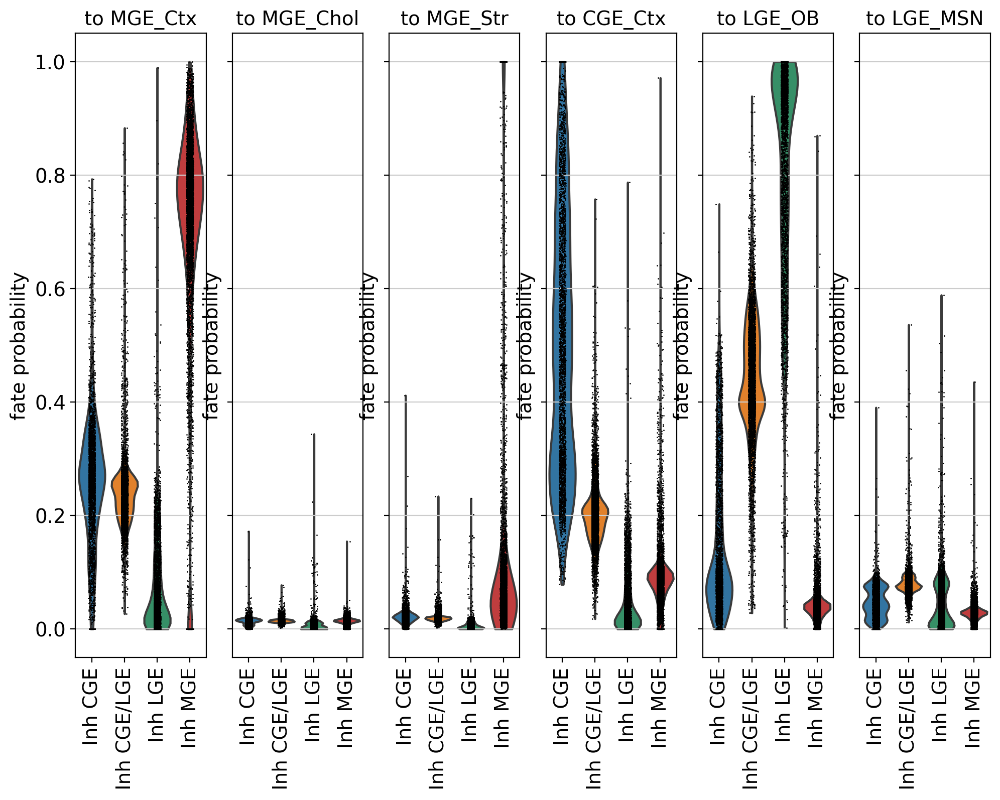

In [6]:
states_to_check = ["arc", "shi", "tsankova"]

cr.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages= None, 
    cluster_key="class",
    clusters= ["Inh CGE", "Inh LGE", "Inh CGE/LGE", "Inh MGE"],
    sharey = True,
    figsize = (10,7)
)

In [90]:
## Well I should make a new file, but here I should
## Figure out how to 
## One: Check how to get the top 100 cells coming from a terminal state that is not the actual terminal state
## Two: Record it as a transition

adata.obsm['lineages_fwd']

"MGE_Cortical_1, MGE_Cortical_2, MGE_Cortical_3, MGE_Cortical_4, MGE_Cortical_5, MGE_Cortical_6, MGE_Cortical_7, MGE_Cortical_8","MGE Subpallial Cholinergic_1, MGE Subpallial Cholinergic_2, MGE Subpallial Cholinergic_3","MGE_Striatal_1, MGE_Striatal_2","CGE_Cortical_1, CGE_Cortical_2, CGE_Cortical_3, CGE_Cortical_4, CGE_Cortical_5, CGE_Cortical_6","LGE OB_1, LGE OB_2, LGE OB_3, LGE OB_4, LGE OB_5, LGE OB_6, LGE OB_7",LGE D1 MSN_2
0.604022,0.020249,0.077838,0.148958,0.100571,0.048365
0.529229,0.026588,0.064098,0.194914,0.106843,0.078332
0.582430,0.020357,0.071162,0.163335,0.114429,0.048289
0.555504,0.020522,0.077182,0.152844,0.144601,0.049350
0.501013,0.027219,0.055471,0.213445,0.116751,0.086103
0.500410,0.027179,0.054833,0.213789,0.117079,0.086713
0.503659,0.026926,0.055318,0.210880,0.114541,0.088681
0.502088,0.019743,0.036106,0.300453,0.095524,0.046088
0.583323,0.021002,0.098709,0.160454,0.086795,0.049720
0.624836,0.019588,0.082905,0.142423,0.085098,0.045154


In [53]:
mge = pd.DataFrame(adata.obsm['lineages_fwd'][:, 0])

In [128]:
sorted(mge[0])[::-1][1:10]

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

In [69]:
mge_ixs = np.argsort(mge[0].values)[::-1]

In [71]:
ranked_mge = adata.obs.iloc[mge_ixs, :]

In [130]:
nomge

,orig.ident,nCount_RNA,nFeature_RNA,unintegrated_clusters,seurat_clusters,celltypes,scvi_clusters,class,dataset,RNA_snn_res.0.5,...,barcode,UMAP_1,UMAP_2,scvi_fate,clusters,macrostates_fwd,init_states_fwd,init_states_fwd_probs,term_states_fwd,term_states_fwd_probs
barcode,,,,,,,,,,,,,,,,,,,,,
GTAACGTGTTGGTTTG.GW12_02_2,GW12_02,6592,2664,NaN,1,NaN,1,NaN,shi,8.0,...,GTAACGTGTTGGTTTG.GW12_02_2,-1.180195,4.533899,MGE_Striatal,MGE_Striatal,NaN,NaN,0.642004,NaN,0.571035
TCAGGATAGCAGACTG.GW09_2,GW09,6446,2492,NaN,5,NaN,5,NaN,shi,8.0,...,TCAGGATAGCAGACTG.GW09_2,2.168086,0.043941,LGE D1 MSN,LGE D1 MSN,NaN,NaN,0.643438,NaN,0.550298
TGGATCACAGCGGTCT-1_7_3,34G,1454,1010,NaN,0,NaN,0,NaN,tsankova,NaN,...,TGGATCACAGCGGTCT-1_7_3,2.342822,2.579588,MGE_Pallial,MGE_Pallial,NaN,NaN,0.641666,NaN,0.575033
GGACAAGAGGATGCGT.GW12_01_2,GW12_01,2805,1533,NaN,3,NaN,3,NaN,shi,8.0,...,GGACAAGAGGATGCGT.GW12_01_2,1.437981,-0.068959,CGE_Subpallial,CGE_Subpallial,NaN,NaN,0.622588,NaN,0.488945
CATCGAACAGATCCAT.GW09_2,GW09,6173,2467,NaN,6,NaN,6,NaN,shi,6.0,...,CATCGAACAGATCCAT.GW09_2,-4.924598,4.262898,Progenitor,Progenitor,NaN,NaN,0.783307,NaN,0.487906
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCCATGGTCCAGCCTT-1_15_3,60G,2120,1110,NaN,16,NaN,16,NaN,tsankova,NaN,...,GCCATGGTCCAGCCTT-1_15_3,3.946240,-1.792562,CGE_Cortical,CGE_Cortical,CGE_Cortical_1,NaN,0.651648,"CGE_Cortical_1, CGE_Cortical_2, CGE_Cortical_3...",0.964141
TGTAACGGTGATACAA-1_10_4,3C,1514,954,NaN,10,NaN,10,NaN,tsankova_ctx,NaN,...,TGTAACGGTGATACAA-1_10_4,9.028082,4.744579,MGE_Cortical,MGE_Cortical,NaN,NaN,0.649692,"MGE_Cortical_1, MGE_Cortical_2, MGE_Cortical_3...",0.963927
TGTACAGCACGGTGTC-1_10_4,3C,5495,2187,NaN,10,NaN,10,NaN,tsankova_ctx,NaN,...,TGTACAGCACGGTGTC-1_10_4,8.388024,4.304191,MGE_Cortical,MGE_Cortical,NaN,NaN,0.649964,"MGE_Cortical_1, MGE_Cortical_2, MGE_Cortical_3...",0.952410


In [129]:
mge = pd.DataFrame(adata.obsm['lineages_fwd'][:, 1])
mge_ixs = np.argsort(mge[0].values)[::-1]
ranked_mge = adata.obs.iloc[mge_ixs, :]
nomge = ranked_mge[ranked_mge["clusters"] != "MGE Subpallial Cholinergic"]
top_100 = nomge['clusters'][1:100]

In [113]:
order = ["MGE_Cortical", "MG

adata.obsm['lineages_fwd']

"MGE_Cortical_1, MGE_Cortical_2, MGE_Cortical_3, MGE_Cortical_4, MGE_Cortical_5, MGE_Cortical_6, MGE_Cortical_7, MGE_Cortical_8","MGE Subpallial Cholinergic_1, MGE Subpallial Cholinergic_2, MGE Subpallial Cholinergic_3","MGE_Striatal_1, MGE_Striatal_2","CGE_Cortical_1, CGE_Cortical_2, CGE_Cortical_3, CGE_Cortical_4, CGE_Cortical_5, CGE_Cortical_6","LGE OB_1, LGE OB_2, LGE OB_3, LGE OB_4, LGE OB_5, LGE OB_6, LGE OB_7",LGE D1 MSN_2
0.604022,0.020249,0.077838,0.148958,0.100571,0.048365
0.529229,0.026588,0.064098,0.194914,0.106843,0.078332
0.582430,0.020357,0.071162,0.163335,0.114429,0.048289
0.555504,0.020522,0.077182,0.152844,0.144601,0.049350
0.501013,0.027219,0.055471,0.213445,0.116751,0.086103
0.500410,0.027179,0.054833,0.213789,0.117079,0.086713
0.503659,0.026926,0.055318,0.210880,0.114541,0.088681
0.502088,0.019743,0.036106,0.300453,0.095524,0.046088
0.583323,0.021002,0.098709,0.160454,0.086795,0.049720
0.624836,0.019588,0.082905,0.142423,0.085098,0.045154


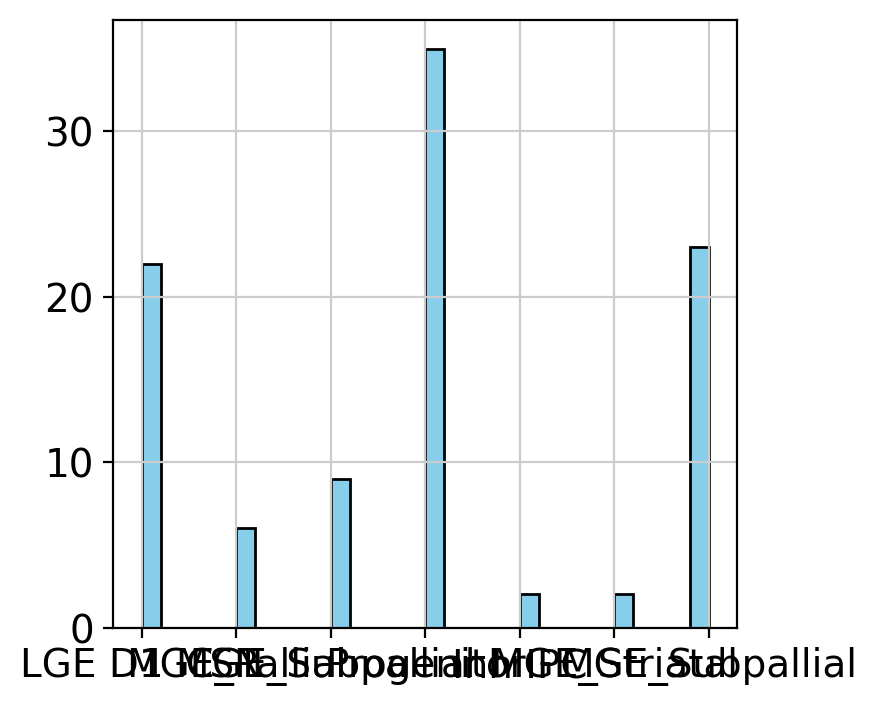

In [124]:
plt.hist(top_100, bins=30, color='skyblue', edgecolor='black')
plt.show()

In [89]:
adata.obs['term_states_fwd'].unique()

[NaN, 'LGE OB_1, LGE OB_2, LGE OB_3, LGE OB_4, LGE O..., 'MGE_Cortical_1, MGE_Cortical_2, MGE_Cortical_..., 'MGE_Striatal_1, MGE_Striatal_2', 'CGE_Cortical_1, CGE_Cortical_2, CGE_Cortical_..., 'MGE Subpallial Cholinergic_1, MGE Subpallial ..., 'LGE D1 MSN_2']
Categories (6, object): ['MGE_Cortical_1, MGE_Cortical_2, MGE_Cortical_..., 'MGE Subpallial Cholinergic_1, MGE Subpallial ..., 'MGE_Striatal_1, MGE_Striatal_2', 'CGE_Cortical_1, CGE_Cortical_2, CGE_Cortical_..., 'LGE OB_1, LGE OB_2, LGE OB_3, LGE OB_4, LGE O..., 'LGE D1 MSN_2']

In [121]:
sum(top_100 == 'CGE_Subpallial')

1

In [122]:
top_100

['LGE D1 MSN', 'MGE_Pallial', 'CGE_Subpallial', 'Progenitor', 'Inh IPC', 'MGE_Striatal', 'MGE_Subpallial']
Categories (14, object): ['CGE/LGE', 'CGE_Cortical', 'CGE_Pallial', 'CGE_Subpallial', ..., 'MGE_Pallial', 'MGE_Striatal', 'MGE_Subpallial', 'Progenitor']

In [40]:
fates = adata.obs[adata.obs['dataset'] == "arc"]["term_states_fwd"]

In [4]:
adata

AnnData object with n_obs × n_vars = 104681 × 42862
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'unintegrated_clusters', 'seurat_clusters', 'celltypes', 'scvi_clusters', 'class', 'dataset', 'RNA_snn_res.0.5', 'ident', 'percent.mt', 'doublets', 'sample', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'cellnames', 'celltypes_final', 'celltypes_sub_final', 'stages_final', 'age', 'scvi_class', 'monocle_pseudotime', 'barcode', 'UMAP_1', 'UMAP_2', 'scvi_fate', 'clusters', 'macrostates_fwd', 'init_states_fwd', 'init_states_fwd_probs', 'term_states_fwd', 'term_states_fwd_probs'
    uns: 'T_fwd_params', 'clusters_colors', 'coarse_fwd', 'diffmap_evals', 'eigendecomposition_fwd', 'fwd_estimator_params', 'init_states_fwd_colors', 'macrostates_fwd_colors', 'neighbors', 'schur_matrix_fwd', 'scvi_class_colors', 'term_states_fwd_colors'
    obsm: 'X_diffmap', 'X_pca', 'X_scvi', 'X_umap', 'lineages_fwd', 'macrostates_fwd_memberships', 'schur_vectors_fwd'
    obsp: 'T_fwd', 'con